__Dependencies__

In [1]:
import copy  # copy big/deep objects by value
import datetime  # datetime operations
import itertools  # operate with iterators
import json  # read/write from/into json format
import os  # OS operations (read/write files/folders)
import warnings  # hide warnings

# process parallelization
from multiprocessing import Manager, Pool, RawArray, cpu_count

import matplotlib.patches as mpatches  # create custom plot legends
import matplotlib.pyplot as plt  # mother of plots focr Python
import matplotlib.ticker as ticker  # matplotlib ticker utils
import numpy as np  # array/matrix operations (e.g. linear algebra)
import pandas as pd  # operate with dataframes
import seaborn as sns  # matplotlib plotting nice with shortcuts
from IPython.display import display  # print nicely
from matplotlib.lines import Line2D  # matplotlib custom lines
from scipy import stats  # statistical tests
from tqdm.notebook import tqdm  # mother of progressbars for Python

# from matplotlib.ticker import FormatStrFormatter  # tick formatter

__Options__

In [2]:
warnings.filterwarnings("ignore")
# set default float display format to 2 decimals
pd.options.display.float_format = "{:.3f}".format

STYLE = "whitegrid"
sns.set(rc={"figure.figsize": (20, 8)})  # figure (plot) size
sns.set_style(STYLE)  # set seaborn plotting style

PATH_PROC = "./data/processed"

# progress bar customized format
B_FORMAT = """📄 {n_fmt} of {total_fmt} {desc} processed: {bar} 
            {percentage:3.0f}% ⏱️{elapsed} ⏳{remaining} ⚙️{rate_fmt}{postfix}"""

"""
Event1: 1162-1400
Event2: 1958-2080
Event3: 2596-2890
"""
event_ranges = [(1162, 1400), (1958, 2080), (2596, 2890)]

CORES = cpu_count()  # number of cpu threads for multiprocessing
print(f"Total CPU threads: {CORES}")

Total CPU threads: 16


__Read participants cleaned data__

In [3]:
parts = pd.read_csv("./participants_clean.csv", keep_default_na=False)
parts = parts.set_index("id")  # set uid column as index (remove default)
parts

,date,expo,side,condition,questionnaire,nulls_%
id,,,,,,
4f583872ffed48249874b00f3d389cfc,2019-05-14 13:21:00,MSW,right,TaxiDriver,No,1.610
33d68ad55ef544fab9fd08108e3913ca,2019-05-14 16:44:00,MSW,right,AVAS,No,0.037
8598a83e2af441b8bcd0ae5d84beb875,2019-05-14 16:51:00,MSW,right,RadioTalk,No,0.037
37d7e67934974217830bb429bba7fd76,2019-05-14 16:54:00,MSW,left,AVAS,No,0.824
42bac596059749b5b8e8e83ae61de9b4,2019-05-14 16:56:00,MSW,right,TaxiDriver,No,0.225
...,...,...,...,...,...,...
cfe9482181f74f80b88cd4b1c048ab94,2019-12-30 15:29:00,BMBF,right,AVAS,No,0.300
611d35a7c3e940cc82495e53c2a8532d,2020-01-03 16:12:00,BMBF,right,TaxiDriver,No,0.674
3b6fda285d9e412eb081986b2f22a2e3,2020-01-03 16:13:00,BMBF,left,AVAS,No,1.797


__Null data check__

In [4]:
COL = "nulls_%"
parts[parts[COL] > 5].sort_values(by=[COL]).index.size

49

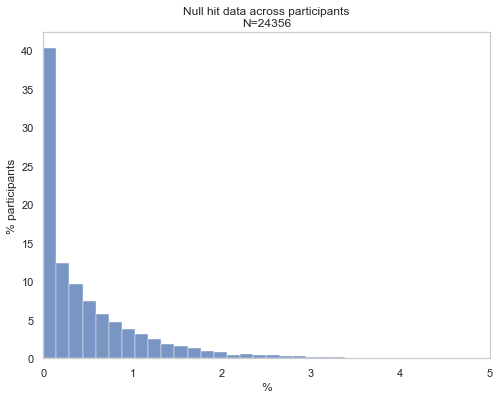

In [5]:
sns.set(rc={"figure.figsize": (8, 6)})  # figure (plot) size
sns.set_style(STYLE)  # set seaborn plotting style

ax = sns.histplot(data=parts["nulls_%"], stat="percent", bins=100)

ax.set_xlim(0, 5)
ax.grid(False)
ax.set_xlabel("%")
ax.set_ylabel("% participants")

plt.title(f"Null hit data across participants\nN={parts.index.size}")
plt.show()

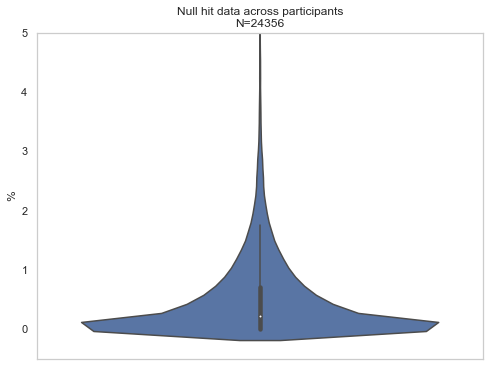

In [6]:
sns.set(rc={"figure.figsize": (8, 6)})  # figure (plot) size
sns.set_style(STYLE)  # set seaborn plotting style

ax = sns.violinplot(data=parts["nulls_%"], stat="percent")

ax.set_ylim(-0.5, 5)
ax.grid(False)
ax.set_xticklabels([])
ax.set_ylabel("%")

plt.title(f"Null hit data across participants\nN={parts.index.size}")
plt.show()

In [7]:
quests = pd.read_csv("./questionnaires.csv", keep_default_na=False)
quests = quests.set_index("id")  # set uid column as index (remove default)
quests

,date,Intention,Usefulness,Ease,Trust,Gender,Age,Aviophobia,Driving,Play,VR,expo,side,condition
id,,,,,,,,,,,,,,
ec61bab6e46741969bceb80ee2246983,2019-05-26 12:06:22,50,50,50,50,intersex,25,1,80,58,more than 10 times,MSW,right,RadioTalk
1fbde03890d94bddaf7aa987fc732607,2019-05-26 16:02:45,100,100,100,96,Male,13,0,0,5,once,MSW,left,RadioTalk
1ad9eea672a94518b150925bac41fcbc,2019-05-26 17:23:38,17,22,0,86,Female,24,0,4,2,once,MSW,right,RadioTalk
461b2d80132f47958e50003c16084cf4,2019-05-26 17:27:34,30,70,80,80,Male,22,0,3,1,less than 10 times,MSW,right,TaxiDriver
4f300efb4a9941f7a96f57e8030b12e2,2019-05-26 17:39:25,100,100,50,50,Male,16,0,0,3,less than 10 times,MSW,right,RadioTalk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
eda9175e9e1d4153ac2ca3038b2ab008,2019-12-23 09:23:08,65,30,33,20,Male,12,0,0,25,once,BMBF,right,RadioTalk
b8c9e625f07444cc8d4a0fc245bab5dd,2019-12-23 09:28:25,100,50,50,100,Female,12,1,99,9,less than 10 times,BMBF,right,TaxiDriver
2cd78ad9a37945de9f8cfd5f81c42082,2019-12-27 12:56:23,86,20,71,69,Male,57,0,39,0,never,BMBF,right,RadioTalk


__Filter out outliers (mean + 2std)__

In [8]:
outs = pd.read_csv("./outliers.csv", index_col=0)
outs = outs[outs["1std"] == False].index.tolist()
parts = parts.loc[outs]
display(parts)
outs_quest = quests.index.intersection(outs)
quests = quests.loc[outs_quest]
display(quests)

,date,expo,side,condition,questionnaire,nulls_%
id,,,,,,
4f583872ffed48249874b00f3d389cfc,2019-05-14 13:21:00,MSW,right,TaxiDriver,No,1.610
33d68ad55ef544fab9fd08108e3913ca,2019-05-14 16:44:00,MSW,right,AVAS,No,0.037
37d7e67934974217830bb429bba7fd76,2019-05-14 16:54:00,MSW,left,AVAS,No,0.824
9cdd85098b0b4ad5ab2282a5ac371a5e,2019-05-14 16:59:00,MSW,right,AVAS,No,0.000
ff846d92c7e6471183595bd2678f29f6,2019-05-14 17:37:00,MSW,right,AVAS,No,0.037
...,...,...,...,...,...,...
dba04b626e4c4c6e89aea4fb1f9cc32b,2019-12-30 13:48:00,BMBF,left,TaxiDriver,Yes,0.000
611d35a7c3e940cc82495e53c2a8532d,2020-01-03 16:12:00,BMBF,right,TaxiDriver,No,0.674
3b6fda285d9e412eb081986b2f22a2e3,2020-01-03 16:13:00,BMBF,left,AVAS,No,1.797


,date,Intention,Usefulness,Ease,Trust,Gender,Age,Aviophobia,Driving,Play,VR,expo,side,condition
id,,,,,,,,,,,,,,
ec61bab6e46741969bceb80ee2246983,2019-05-26 12:06:22,50,50,50,50,intersex,25,1,80,58,more than 10 times,MSW,right,RadioTalk
1fbde03890d94bddaf7aa987fc732607,2019-05-26 16:02:45,100,100,100,96,Male,13,0,0,5,once,MSW,left,RadioTalk
1ad9eea672a94518b150925bac41fcbc,2019-05-26 17:23:38,17,22,0,86,Female,24,0,4,2,once,MSW,right,RadioTalk
461b2d80132f47958e50003c16084cf4,2019-05-26 17:27:34,30,70,80,80,Male,22,0,3,1,less than 10 times,MSW,right,TaxiDriver
4f300efb4a9941f7a96f57e8030b12e2,2019-05-26 17:39:25,100,100,50,50,Male,16,0,0,3,less than 10 times,MSW,right,RadioTalk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
eda9175e9e1d4153ac2ca3038b2ab008,2019-12-23 09:23:08,65,30,33,20,Male,12,0,0,25,once,BMBF,right,RadioTalk
b8c9e625f07444cc8d4a0fc245bab5dd,2019-12-23 09:28:25,100,50,50,100,Female,12,1,99,9,less than 10 times,BMBF,right,TaxiDriver
2cd78ad9a37945de9f8cfd5f81c42082,2019-12-27 12:56:23,86,20,71,69,Male,57,0,39,0,never,BMBF,right,RadioTalk


__Descriptive statistics from each numerical variable__

In [9]:
cols = list(quests.describe().columns.difference(["frames", "Aviophobia"]))
quests[cols].describe()

,Age,Driving,Ease,Intention,Play,Trust,Usefulness
count,8207.000,8207.000,8207.000,8207.000,8207.000,8207.000,8207.000
mean,29.994,16.178,64.885,61.308,9.121,66.387,63.971
std,21.240,21.767,31.429,34.445,21.214,32.085,32.331
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,13.000,0.000,50.000,34.000,0.000,45.500,50.000
50%,21.000,6.000,70.000,67.000,1.000,75.000,70.000
75%,46.000,28.000,100.000,100.000,7.000,100.000,99.000
max,99.000,99.000,100.000,100.000,99.000,100.000,100.000


__Distribution of each numerical variable__

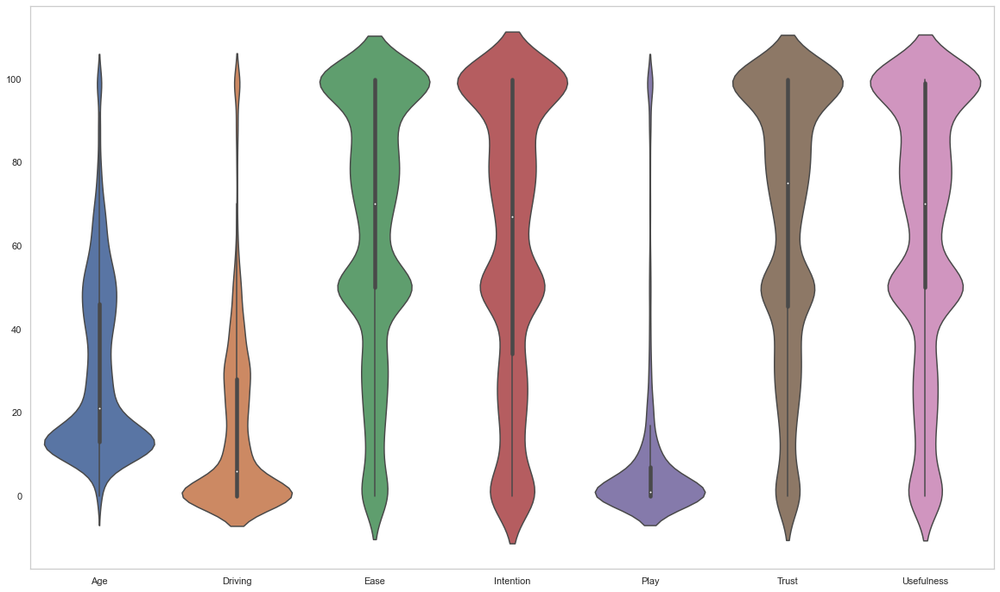

In [10]:
plt.figure(figsize=(20, 12))
ax = sns.violinplot(
    data=quests[quests.columns.difference(["frames", "Aviophobia"])],
    order=cols,
    scale="width",
)
ax.grid(False)
plt.show()

__Correlation matrix of the numerical variables__

,Age,Aviophobia,Driving,Ease,Intention,Play,Trust,Usefulness
Age,1.000,-0.017,0.629,-0.132,-0.147,-0.048,-0.120,-0.131
Aviophobia,-0.017,1.000,0.083,-0.082,-0.056,0.175,-0.095,-0.061
Driving,0.629,0.083,1.000,-0.079,-0.092,0.251,-0.108,-0.110
Ease,-0.132,-0.082,-0.079,1.000,0.600,0.056,0.487,0.535
Intention,-0.147,-0.056,-0.092,0.600,1.000,0.038,0.511,0.637
Play,-0.048,0.175,0.251,0.056,0.038,1.000,-0.051,0.016
Trust,-0.120,-0.095,-0.108,0.487,0.511,-0.051,1.000,0.470
Usefulness,-0.131,-0.061,-0.110,0.535,0.637,0.016,0.470,1.000


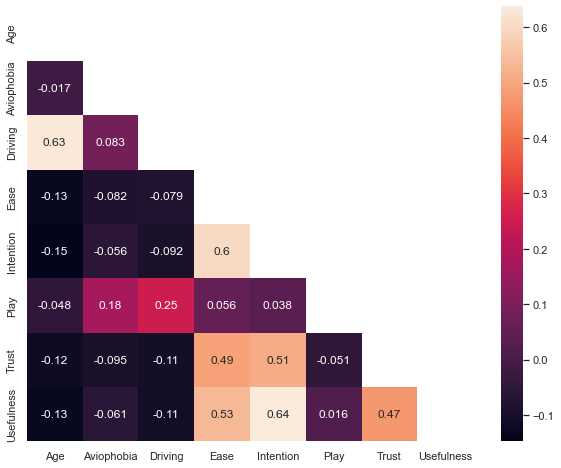

In [11]:
# remove the number of frames as it's uninformative
parts_an = copy.deepcopy(quests[quests.columns.difference(["frames"])])

cm_parts = parts_an.corr(method="pearson")
display(cm_parts)

# generate a mask to drop the upper part of the matrix (duplicated info)
mask = np.triu(np.ones_like(cm_parts, dtype=np.bool))

# figure size
plt.figure(figsize=(10, 8))

# display the correlation matrix as a heatmap
sns.heatmap(cm_parts, annot=True, mask=mask)
plt.show()

__Population count and density for each categorical variable__

,count,%
Gender,,
Male,4358,53.101
Female,3069,37.395
intersex,431,5.252
N/A,349,4.252


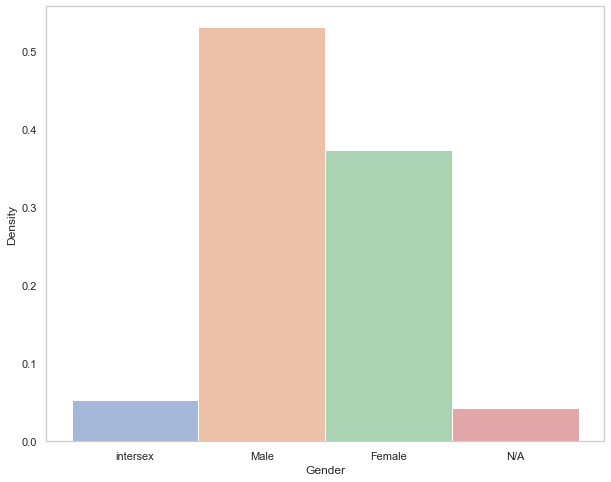

,count,%
VR,,
never,2708,32.996
less than 10 times,2613,31.839
once,1807,22.018
more than 10 times,1079,13.147


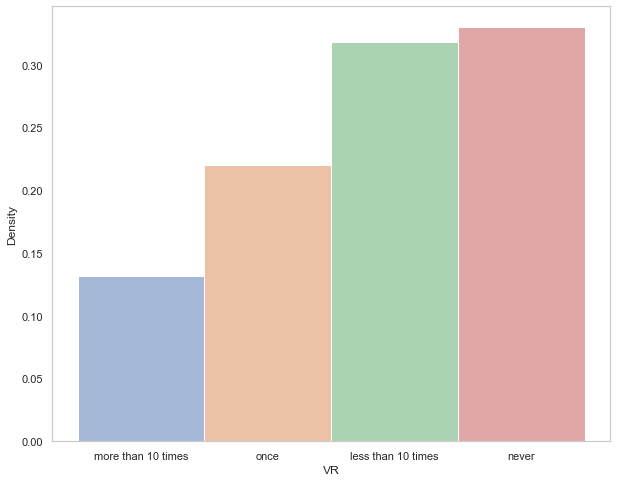

,count,%
expo,,
MSW,7271,88.595
BMBF,936,11.405


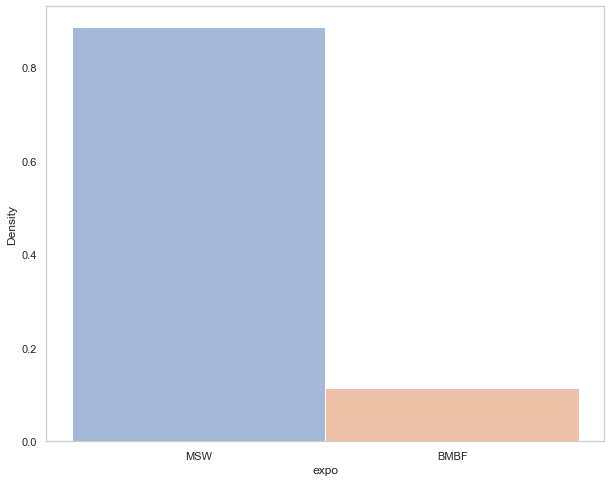

,count,%
condition,,
AVAS,2870,34.970
TaxiDriver,2671,32.545
RadioTalk,2666,32.484


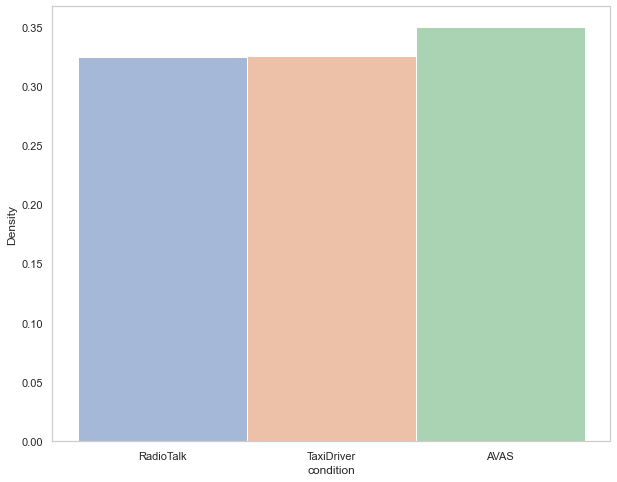

In [12]:
# categorical columns to compute descriptive statistics
cols = ["Gender", "VR", "expo", "condition"]
for col in cols:  # for each defined column
    counts = quests[col].value_counts()
    percents = quests[col].value_counts(normalize=True).mul(100)
    df = pd.DataFrame({"count": counts, "%": percents})
    df.index.name = col
    # show counts vs percentage
    display(df)
    # plot directly without the previous calculations (seaborn takes care of it)
    plt.figure(figsize=(10, 8))
    ax = sns.histplot(
        data=quests, x=col, hue=col, stat="density", legend=False
    )
    ax.grid(False)
    plt.show()

In [13]:
hev_cnts = pd.read_csv("./hit_events_counters.csv", index_col=0)
display(hev_cnts)
display(hev_cnts.describe())

,rest_cnt,gaze_cnt,rest_avg,gaze_avg,rest_mdn,gaze_mdn,rest_dist_avg,gaze_dist_avg,rest_dist_mdn,gaze_dist_mdn,rest_len,gaze_len,rest_l_%,gaze_l_%,rest_c_%,gaze_c_%
4f583872ffed48249874b00f3d389cfc,434.000,67.000,0.066,0.876,0.033,0.495,104.681,100.493,85.326,66.196,28.644,58.707,32.792,67.208,86.627,13.373
33d68ad55ef544fab9fd08108e3913ca,280.000,80.000,0.083,0.811,0.066,0.611,20.270,10.064,2.389,2.369,23.232,64.911,26.357,73.643,77.778,22.222
8598a83e2af441b8bcd0ae5d84beb875,110.000,37.000,0.089,1.336,0.066,0.660,95.261,148.664,47.726,92.824,9.834,49.434,16.592,83.408,74.830,25.170
37d7e67934974217830bb429bba7fd76,586.000,69.000,0.059,0.767,0.033,0.396,120.903,101.458,81.686,58.163,34.815,52.899,39.691,60.309,89.466,10.534
42bac596059749b5b8e8e83ae61de9b4,333.000,70.000,0.073,0.774,0.066,0.462,166.052,158.886,104.916,100.255,24.420,54.186,31.066,68.934,82.630,17.370
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cfe9482181f74f80b88cd4b1c048ab94,197.000,67.000,0.080,0.786,0.066,0.462,155.156,120.764,74.446,73.856,15.675,52.635,22.947,77.053,74.621,25.379
611d35a7c3e940cc82495e53c2a8532d,380.000,56.000,0.070,1.097,0.033,0.627,107.759,69.995,69.104,45.891,26.532,61.446,30.158,69.842,87.156,12.844
3b6fda285d9e412eb081986b2f22a2e3,456.000,85.000,0.068,0.665,0.033,0.495,77.189,41.573,36.824,14.536,30.855,56.496,35.323,64.677,84.288,15.712
18ffb0abdc8642098c479380bfa533d1,544.000,77.000,0.068,0.589,0.033,0.429,117.366,85.315,65.854,42.028,37.092,45.342,44.996,55.004,87.601,12.399


,rest_cnt,gaze_cnt,rest_avg,gaze_avg,rest_mdn,gaze_mdn,rest_dist_avg,gaze_dist_avg,rest_dist_mdn,gaze_dist_mdn,rest_len,gaze_len,rest_l_%,gaze_l_%,rest_c_%,gaze_c_%
count,24356.000,24356.000,24355.000,24356.000,24355.000,24356.000,24355.000,24356.000,24355.000,24356.000,24356.000,24356.000,24356.000,24356.000,24356.000,24356.000
mean,359.144,67.524,0.073,0.958,0.049,0.535,77.799,68.652,43.551,35.107,25.499,58.630,30.212,69.788,81.851,18.149
std,155.739,13.208,0.008,0.988,0.017,0.803,44.886,54.065,35.449,36.454,9.704,10.288,11.101,11.101,7.120,7.120
min,0.000,1.000,0.033,0.461,0.033,0.330,0.236,0.267,0.165,0.267,0.000,23.331,0.000,31.587,0.000,5.088
25%,245.000,61.000,0.068,0.703,0.033,0.446,41.345,19.174,7.308,2.465,18.711,51.381,22.601,61.875,78.717,13.279
50%,357.000,69.000,0.072,0.818,0.033,0.495,80.208,59.114,41.028,22.380,25.905,57.849,30.700,69.300,83.444,16.556
75%,467.000,76.000,0.077,1.007,0.066,0.561,110.569,108.475,68.260,62.087,32.406,65.472,38.125,77.399,86.721,21.283
max,958.000,102.000,0.143,88.143,0.148,88.143,230.400,267.032,207.666,204.840,59.895,88.143,68.413,100.000,94.912,100.000


In [14]:
hit_levs = pd.read_csv(f"./group_length_percentages.csv", index_col=0)
hit_levs

,Buildings,Dynamic Cars,Dynamic Pedestrians,Inside Car,Nature,Roads,Static Cars,Static Pedestrians,Street Objects,Traffic Lights,Traffic Signs
4f583872ffed48249874b00f3d389cfc,31.366,1.574,1.911,3.204,6.127,31.141,0.000,0.000,1.967,22.709,0.000
33d68ad55ef544fab9fd08108e3913ca,0.000,0.915,0.000,44.179,0.458,46.772,0.000,0.000,0.559,7.117,0.000
8598a83e2af441b8bcd0ae5d84beb875,77.503,0.000,0.000,1.268,1.869,0.000,0.000,0.000,0.734,18.625,0.000
37d7e67934974217830bb429bba7fd76,32.626,4.741,2.121,8.921,9.545,2.121,0.624,0.000,3.805,35.496,0.000
42bac596059749b5b8e8e83ae61de9b4,63.825,0.000,0.000,0.974,11.815,0.000,0.000,0.000,4.263,19.123,0.000
...,...,...,...,...,...,...,...,...,...,...,...
cfe9482181f74f80b88cd4b1c048ab94,64.702,0.000,0.000,12.226,5.204,0.000,0.000,0.000,1.944,15.925,0.000
611d35a7c3e940cc82495e53c2a8532d,30.988,0.000,0.000,39.527,7.626,4.619,0.000,0.000,1.719,14.930,0.591
3b6fda285d9e412eb081986b2f22a2e3,13.843,0.000,0.818,32.535,1.168,29.381,0.000,1.986,10.397,9.871,0.000
18ffb0abdc8642098c479380bfa533d1,32.460,0.582,0.000,12.082,10.917,14.119,0.000,0.000,3.275,25.182,1.383


In [15]:
hit_cevs = pd.read_csv(f"./group_counts_percentages.csv", index_col=0)
hit_cevs

,Buildings,Dynamic Cars,Dynamic Pedestrians,Inside Car,Nature,Roads,Static Cars,Static Pedestrians,Street Objects,Traffic Lights,Traffic Signs
4f583872ffed48249874b00f3d389cfc,34.328,2.985,1.493,4.478,11.940,28.358,0.000,0.000,5.970,10.448,0.000
33d68ad55ef544fab9fd08108e3913ca,0.000,2.500,0.000,52.500,1.250,40.000,0.000,0.000,1.250,2.500,0.000
8598a83e2af441b8bcd0ae5d84beb875,64.865,0.000,0.000,5.405,8.108,0.000,0.000,0.000,2.703,18.919,0.000
37d7e67934974217830bb429bba7fd76,37.681,4.348,1.449,14.493,15.942,5.797,1.449,0.000,8.696,10.145,0.000
42bac596059749b5b8e8e83ae61de9b4,57.143,0.000,0.000,2.857,20.000,0.000,0.000,0.000,7.143,12.857,0.000
...,...,...,...,...,...,...,...,...,...,...,...
cfe9482181f74f80b88cd4b1c048ab94,62.687,0.000,0.000,13.433,8.955,0.000,0.000,0.000,2.985,11.940,0.000
611d35a7c3e940cc82495e53c2a8532d,33.929,0.000,0.000,32.143,14.286,7.143,0.000,0.000,5.357,5.357,1.786
3b6fda285d9e412eb081986b2f22a2e3,11.765,0.000,1.176,30.588,2.353,34.118,0.000,2.353,10.588,7.059,0.000
18ffb0abdc8642098c479380bfa533d1,31.169,1.299,0.000,16.883,15.584,12.987,0.000,0.000,5.195,14.286,2.597


__Filter out outliers (mean + 2std)__

In [16]:
hit_cevs = hit_cevs.loc[outs]
hit_levs = hit_levs.loc[outs]

In [17]:
hit_levs = hit_levs.join(
    parts[["expo", "side", "condition", "questionnaire"]], how="outer"
)
hit_levs

,Buildings,Dynamic Cars,Dynamic Pedestrians,Inside Car,Nature,Roads,Static Cars,Static Pedestrians,Street Objects,Traffic Lights,Traffic Signs,expo,side,condition,questionnaire
4f583872ffed48249874b00f3d389cfc,31.366,1.574,1.911,3.204,6.127,31.141,0.000,0.000,1.967,22.709,0.000,MSW,right,TaxiDriver,No
33d68ad55ef544fab9fd08108e3913ca,0.000,0.915,0.000,44.179,0.458,46.772,0.000,0.000,0.559,7.117,0.000,MSW,right,AVAS,No
37d7e67934974217830bb429bba7fd76,32.626,4.741,2.121,8.921,9.545,2.121,0.624,0.000,3.805,35.496,0.000,MSW,left,AVAS,No
9cdd85098b0b4ad5ab2282a5ac371a5e,59.370,0.000,0.000,7.589,12.132,1.652,0.000,0.000,3.975,15.281,0.000,MSW,right,AVAS,No
ff846d92c7e6471183595bd2678f29f6,66.428,0.440,0.771,1.651,10.292,1.761,0.000,0.000,4.843,13.814,0.000,MSW,right,AVAS,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
dba04b626e4c4c6e89aea4fb1f9cc32b,74.731,0.000,0.000,0.000,7.625,0.000,0.000,0.000,4.448,13.196,0.000,BMBF,left,TaxiDriver,Yes
611d35a7c3e940cc82495e53c2a8532d,30.988,0.000,0.000,39.527,7.626,4.619,0.000,0.000,1.719,14.930,0.591,BMBF,right,TaxiDriver,No
3b6fda285d9e412eb081986b2f22a2e3,13.843,0.000,0.818,32.535,1.168,29.381,0.000,1.986,10.397,9.871,0.000,BMBF,left,AVAS,No
18ffb0abdc8642098c479380bfa533d1,32.460,0.582,0.000,12.082,10.917,14.119,0.000,0.000,3.275,25.182,1.383,BMBF,left,RadioTalk,Yes


In [18]:
hit_cevs = hit_cevs.join(
    parts[["expo", "side", "condition", "questionnaire"]], how="outer"
)
hit_cevs

,Buildings,Dynamic Cars,Dynamic Pedestrians,Inside Car,Nature,Roads,Static Cars,Static Pedestrians,Street Objects,Traffic Lights,Traffic Signs,expo,side,condition,questionnaire
4f583872ffed48249874b00f3d389cfc,34.328,2.985,1.493,4.478,11.940,28.358,0.000,0.000,5.970,10.448,0.000,MSW,right,TaxiDriver,No
33d68ad55ef544fab9fd08108e3913ca,0.000,2.500,0.000,52.500,1.250,40.000,0.000,0.000,1.250,2.500,0.000,MSW,right,AVAS,No
37d7e67934974217830bb429bba7fd76,37.681,4.348,1.449,14.493,15.942,5.797,1.449,0.000,8.696,10.145,0.000,MSW,left,AVAS,No
9cdd85098b0b4ad5ab2282a5ac371a5e,59.375,0.000,0.000,6.250,15.625,3.125,0.000,0.000,9.375,6.250,0.000,MSW,right,AVAS,No
ff846d92c7e6471183595bd2678f29f6,53.571,1.786,1.786,3.571,16.071,3.571,0.000,0.000,10.714,8.929,0.000,MSW,right,AVAS,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
dba04b626e4c4c6e89aea4fb1f9cc32b,67.647,0.000,0.000,0.000,14.706,0.000,0.000,0.000,11.765,5.882,0.000,BMBF,left,TaxiDriver,Yes
611d35a7c3e940cc82495e53c2a8532d,33.929,0.000,0.000,32.143,14.286,7.143,0.000,0.000,5.357,5.357,1.786,BMBF,right,TaxiDriver,No
3b6fda285d9e412eb081986b2f22a2e3,11.765,0.000,1.176,30.588,2.353,34.118,0.000,2.353,10.588,7.059,0.000,BMBF,left,AVAS,No
18ffb0abdc8642098c479380bfa533d1,31.169,1.299,0.000,16.883,15.584,12.987,0.000,0.000,5.195,14.286,2.597,BMBF,left,RadioTalk,Yes


In [19]:
display(hit_levs.describe())
display(hit_cevs.describe())

,Buildings,Dynamic Cars,Dynamic Pedestrians,Inside Car,Nature,Roads,Static Cars,Static Pedestrians,Street Objects,Traffic Lights,Traffic Signs
count,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000
mean,23.822,0.880,0.549,35.291,4.273,20.139,0.056,0.061,2.055,12.546,0.328
std,21.775,1.546,0.998,26.427,4.633,18.795,0.266,0.315,2.341,6.701,0.988
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,3.204,0.000,0.000,11.417,0.455,5.466,0.000,0.000,0.000,6.768,0.000
50%,18.169,0.000,0.000,30.567,2.746,15.229,0.000,0.000,1.345,11.512,0.000
75%,41.809,1.177,0.729,57.143,6.889,29.104,0.000,0.000,3.175,17.281,0.000
max,84.044,14.747,17.388,100.000,32.171,100.000,5.383,8.671,27.878,40.564,13.337


,Buildings,Dynamic Cars,Dynamic Pedestrians,Inside Car,Nature,Roads,Static Cars,Static Pedestrians,Street Objects,Traffic Lights,Traffic Signs
count,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000
mean,23.942,1.226,1.052,35.861,6.888,19.578,0.104,0.101,3.603,7.052,0.593
std,19.671,1.842,1.619,23.652,6.642,15.306,0.439,0.430,3.837,3.982,1.624
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,5.405,0.000,0.000,15.000,1.250,7.143,0.000,0.000,0.000,3.704,0.000
50%,20.482,0.000,0.000,33.803,5.195,17.284,0.000,0.000,2.667,6.757,0.000
75%,40.278,1.639,1.538,55.882,11.290,28.889,0.000,0.000,5.479,9.859,0.000
max,78.333,15.625,19.753,100.000,39.080,100.000,6.349,5.660,39.474,30.769,18.033


In [20]:
grp_cats = [
    "Buildings",
    # "Crosswalks",
    "Dynamic Cars",
    "Dynamic Pedestrians",
    # "End",
    # "Events",
    "Inside Car",
    "Nature",
    "Roads",
    # "Sky",
    # "Start",
    "Static Cars",
    "Static Pedestrians",
    "Street Objects",
    "Traffic Lights",
    "Traffic Signs",
]

palette = itertools.cycle(sns.color_palette(palette="deep"))  # color palette

colors = [next(palette) for i in range(3)]

sns.set_style(STYLE)  # set seaborn plotting style


def normalize_from_condition(s):
    """Normalize a series (dataframe column)."""
    # Mean normalization: (s - s.min()) / (s.max() - s.min())
    # Std normalization: (s - s.mean()) / s.std()
    s = s / s.loc["TaxiDriver"] - 1
    return s.loc[["AVAS", "RadioTalk"]]


def normalize_series(s):
    """Normalize a series (dataframe column)."""
    # Mean normalization: (s - s.min()) / (s.max() - s.min())
    # Std normalization: (s - s.mean()) / s.std()
    return (s - s.min()) / (s.max() - s.min())

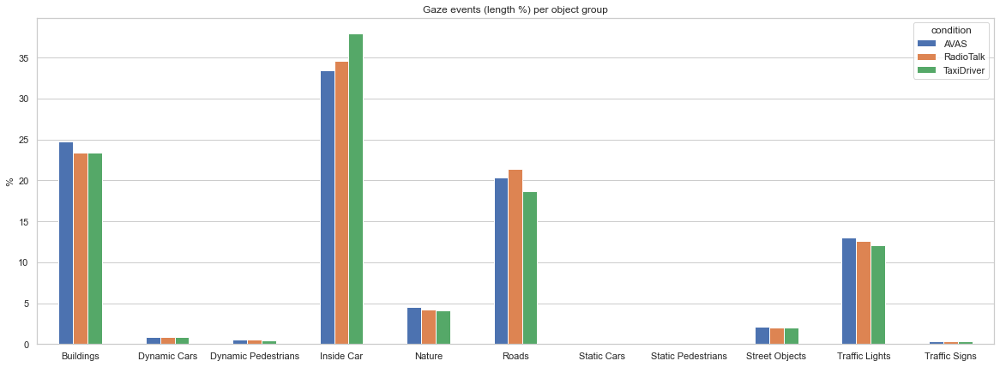

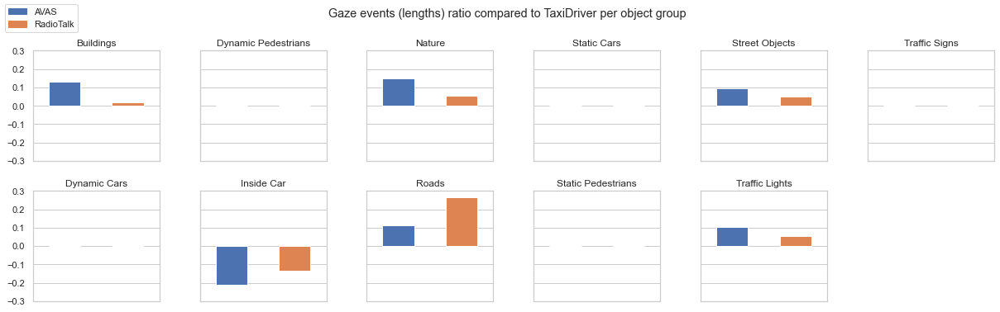

In [21]:
sns.set(rc={"figure.figsize": (20, 7)})
sns.set_style(STYLE)  # set seaborn plotting style

ax = hit_levs.groupby(["condition"]).mean().transpose().plot.bar(rot=0)

ax.set_ylabel("%")
ax.xaxis.grid(False)

plt.title("Gaze events (length %) per object group")

plt.show()

NROWS = 2
NCOLS = 6

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(17, 5.5))
fig.suptitle(
    "Gaze events (lengths) ratio compared to TaxiDriver per object group\n"
)
fig.tight_layout()

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 11:
            grp = grp_cats[i]
            s = normalize_from_condition(
                hit_levs.groupby(["condition"])[grp].median()
            )
            ax = s.transpose().plot.bar(rot=0, color=colors, ax=axes[r, c])
            i += 1
            if c != 0:
                ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(grp)
            ax.set_ylim(-0.3, 0.3)
            ax.set_xticks([])

fig.delaxes(axes[1, 5])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
fig.legend(handles=[avas_patch, radio_patch], loc="upper left")
plt.show()

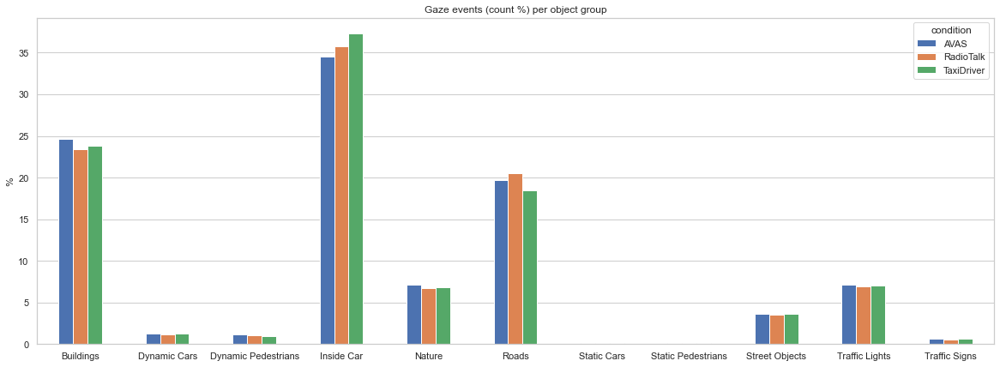

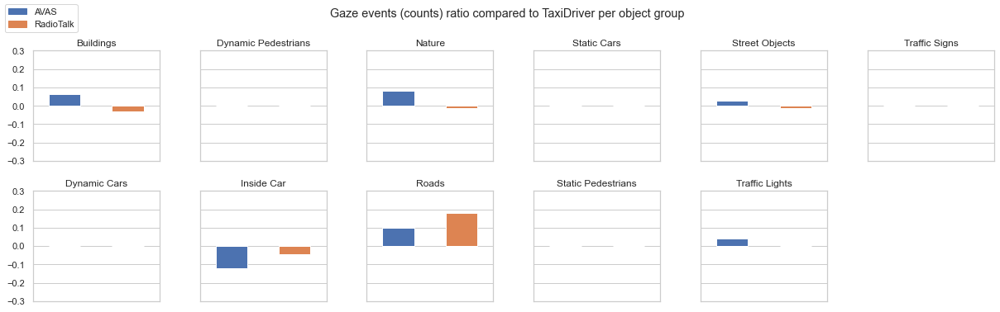

In [22]:
sns.set(rc={"figure.figsize": (20, 7)})
sns.set_style(STYLE)  # set seaborn plotting style

ax = hit_cevs.groupby(["condition"]).mean().transpose().plot.bar(rot=0)

ax.set_ylabel("%")
ax.xaxis.grid(False)

plt.title("Gaze events (count %) per object group")

plt.show()

NROWS = 2
NCOLS = 6

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(17, 5.5))
fig.suptitle(
    "Gaze events (counts) ratio compared to TaxiDriver per object group\n"
)
fig.tight_layout()

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 11:
            grp = grp_cats[i]
            s = normalize_from_condition(
                hit_cevs.groupby(["condition"])[grp].median()
            )
            ax = s.transpose().plot.bar(rot=0, color=colors, ax=axes[r, c])
            i += 1
            if c != 0:
                ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(grp)
            ax.set_ylim(-0.3, 0.3)
            ax.set_xticks([])

fig.delaxes(axes[1, 5])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
fig.legend(handles=[avas_patch, radio_patch], loc="upper left")
plt.show()

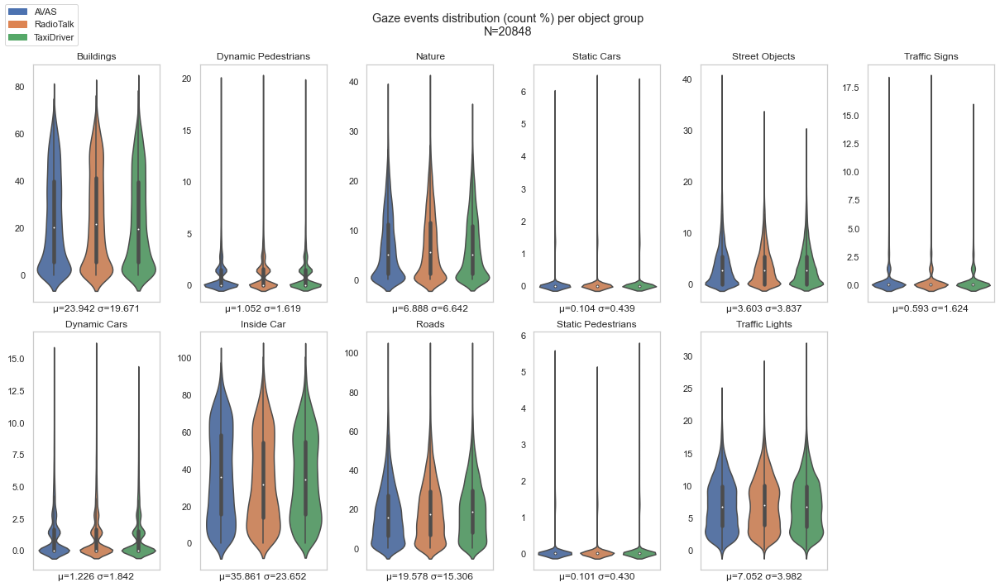

In [23]:
NROWS = 2
NCOLS = 6
N = hit_cevs.index.size

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(17, 10))
fig.suptitle(f"Gaze events distribution (count %) per object group\nN={N}\n")
fig.tight_layout()

# h_cs = hit_cevs.groupby(["condition"])

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 11:
            grp = grp_cats[i]
            mean = hit_cevs[grp].mean()
            std = hit_cevs[grp].std()
            title_extra = f"μ={mean:.3f} σ={std:.3f}"
            # s = normalize_series(hit_cevs[grp])
            ax = sns.violinplot(
                data=hit_cevs, x="condition", y=grp, ax=axes[r, c]
            )
            i += 1
            # if c != 0:
            #     ax.set_yticklabels([])
            ax.set_ylabel(None)
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp}")
            ax.set_xlabel(title_extra)
            # ax.set_ylim(-10, 110)
            ax.set_xticks([])
            ax.grid(False)

fig.delaxes(axes[1, 5])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
taxi_patch = mpatches.Patch(color=colors[2], label="TaxiDriver")
fig.legend(handles=[avas_patch, radio_patch, taxi_patch], loc="upper left")
plt.show()

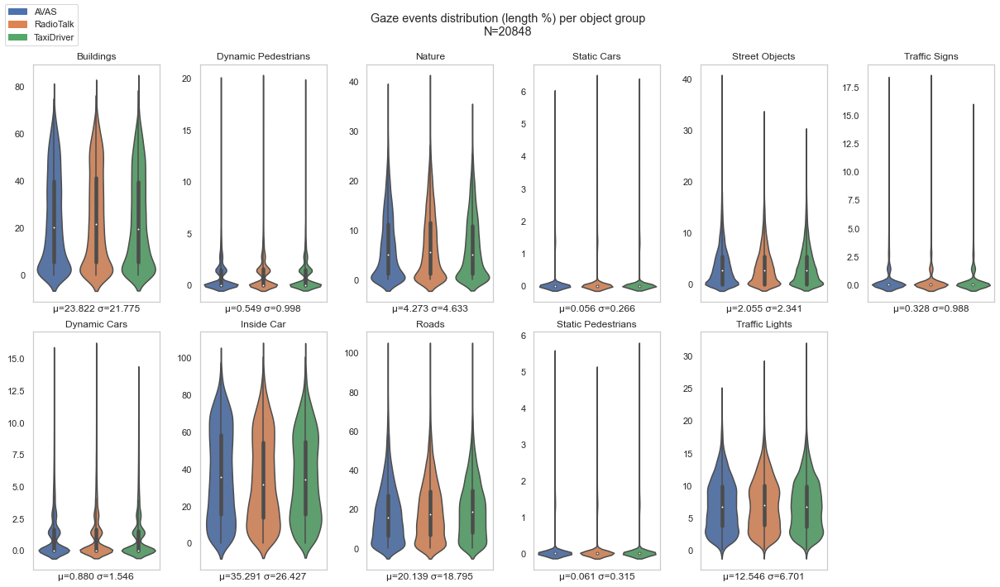

In [24]:
NROWS = 2
NCOLS = 6
N = hit_levs.index.size

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(17, 10))
fig.suptitle(f"Gaze events distribution (length %) per object group\nN={N}\n")
fig.tight_layout()

# h_cs = hit_cevs.groupby(["condition"])

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 11:
            grp = grp_cats[i]
            mean = hit_levs[grp].mean()
            std = hit_levs[grp].std()
            title_extra = f"μ={mean:.3f} σ={std:.3f}"
            # s = normalize_series(hit_cevs[grp])
            ax = sns.violinplot(
                data=hit_cevs, x="condition", y=grp, ax=axes[r, c]
            )
            i += 1
            # if c != 0:
            #     ax.set_yticklabels([])
            ax.set_ylabel(None)
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp}")
            ax.set_xlabel(title_extra)
            # ax.set_ylim(-10, 110)
            ax.set_xticks([])
            ax.grid(False)

fig.delaxes(axes[1, 5])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
taxi_patch = mpatches.Patch(color=colors[2], label="TaxiDriver")
fig.legend(handles=[avas_patch, radio_patch, taxi_patch], loc="upper left")
plt.show()

In [25]:
hit_cevs.sum(axis=1)

4f583872ffed48249874b00f3d389cfc   100.000
33d68ad55ef544fab9fd08108e3913ca   100.000
37d7e67934974217830bb429bba7fd76   100.000
9cdd85098b0b4ad5ab2282a5ac371a5e   100.000
ff846d92c7e6471183595bd2678f29f6   100.000
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d   100.000
3b6fda285d9e412eb081986b2f22a2e3   100.000
18ffb0abdc8642098c479380bfa533d1   100.000
c06f123b35b74bb489ec239b1cac9eb4   100.000
Length: 20848, dtype: float64

In [26]:
hit_levs.sum(axis=1)

4f583872ffed48249874b00f3d389cfc   100.000
33d68ad55ef544fab9fd08108e3913ca   100.000
37d7e67934974217830bb429bba7fd76   100.000
9cdd85098b0b4ad5ab2282a5ac371a5e   100.000
ff846d92c7e6471183595bd2678f29f6   100.000
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d   100.000
3b6fda285d9e412eb081986b2f22a2e3   100.000
18ffb0abdc8642098c479380bfa533d1   100.000
c06f123b35b74bb489ec239b1cac9eb4   100.000
Length: 20848, dtype: float64

Final Groups

In [27]:
final_groups = ["Buildings", "Inside Car", "Nature", "condition"]
# length
gaze_levs = hit_levs[final_groups]
gaze_levs["Cars and Pedestrians"] = (
    hit_levs["Dynamic Cars"] + hit_levs["Dynamic Pedestrians"]
)
gaze_levs["Roads"] = hit_levs["Static Cars"] + hit_levs["Roads"]
gaze_levs["Street Objects"] = (
    hit_levs["Street Objects"] + hit_levs["Static Pedestrians"]
)
gaze_levs["Traffic Signs"] = (
    hit_levs["Traffic Signs"] + hit_levs["Traffic Lights"]
)

# count
gaze_cevs = hit_cevs[final_groups]
gaze_cevs["Cars and Pedestrians"] = (
    hit_cevs["Dynamic Cars"] + hit_cevs["Dynamic Pedestrians"]
)
gaze_cevs["Roads"] = hit_cevs["Static Cars"] + hit_cevs["Roads"]
gaze_cevs["Street Objects"] = (
    hit_cevs["Street Objects"] + hit_cevs["Static Pedestrians"]
)
gaze_cevs["Traffic Signs"] = (
    hit_cevs["Traffic Signs"] + hit_cevs["Traffic Lights"]
)

# TR vs non-TR
gaze_ltr = pd.DataFrame(columns=["TR", "non-TR"])
gaze_ltr["TR"] = (
    gaze_levs["Cars and Pedestrians"]
    + gaze_levs["Roads"]
    + gaze_levs["Traffic Signs"]
)
gaze_ltr["non-TR"] = (
    gaze_levs["Buildings"] + gaze_levs["Nature"] + gaze_levs["Street Objects"]
)
gaze_ltr["condition"] = gaze_levs["condition"]
gaze_ctr = pd.DataFrame(columns=["TR", "non-TR"])
gaze_ctr["TR"] = (
    gaze_cevs["Cars and Pedestrians"]
    + gaze_cevs["Roads"]
    + gaze_cevs["Traffic Signs"]
)
gaze_ctr["non-TR"] = (
    gaze_cevs["Buildings"] + gaze_cevs["Nature"] + gaze_cevs["Street Objects"]
)
gaze_ctr["condition"] = gaze_cevs["condition"]

In [28]:
gaze_levs.sum(axis=1)

4f583872ffed48249874b00f3d389cfc   100.000
33d68ad55ef544fab9fd08108e3913ca   100.000
37d7e67934974217830bb429bba7fd76   100.000
9cdd85098b0b4ad5ab2282a5ac371a5e   100.000
ff846d92c7e6471183595bd2678f29f6   100.000
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d   100.000
3b6fda285d9e412eb081986b2f22a2e3   100.000
18ffb0abdc8642098c479380bfa533d1   100.000
c06f123b35b74bb489ec239b1cac9eb4   100.000
Length: 20848, dtype: float64

In [29]:
gaze_cevs.sum(axis=1)

4f583872ffed48249874b00f3d389cfc   100.000
33d68ad55ef544fab9fd08108e3913ca   100.000
37d7e67934974217830bb429bba7fd76   100.000
9cdd85098b0b4ad5ab2282a5ac371a5e   100.000
ff846d92c7e6471183595bd2678f29f6   100.000
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d   100.000
3b6fda285d9e412eb081986b2f22a2e3   100.000
18ffb0abdc8642098c479380bfa533d1   100.000
c06f123b35b74bb489ec239b1cac9eb4   100.000
Length: 20848, dtype: float64

In [30]:
gaze_ltr.sum(axis=1)

4f583872ffed48249874b00f3d389cfc    96.796
33d68ad55ef544fab9fd08108e3913ca    55.821
37d7e67934974217830bb429bba7fd76    91.079
9cdd85098b0b4ad5ab2282a5ac371a5e    92.411
ff846d92c7e6471183595bd2678f29f6    98.349
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d    60.473
3b6fda285d9e412eb081986b2f22a2e3    67.465
18ffb0abdc8642098c479380bfa533d1    87.918
c06f123b35b74bb489ec239b1cac9eb4    41.118
Length: 20848, dtype: float64

In [31]:
gaze_ctr.sum(axis=1)

4f583872ffed48249874b00f3d389cfc    95.522
33d68ad55ef544fab9fd08108e3913ca    47.500
37d7e67934974217830bb429bba7fd76    85.507
9cdd85098b0b4ad5ab2282a5ac371a5e    93.750
ff846d92c7e6471183595bd2678f29f6    96.429
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d    67.857
3b6fda285d9e412eb081986b2f22a2e3    69.412
18ffb0abdc8642098c479380bfa533d1    83.117
c06f123b35b74bb489ec239b1cac9eb4    42.857
Length: 20848, dtype: float64

Fix percentages for TR vs non-TR gaze lengths

In [32]:
new_gaze_ltr = copy.deepcopy(gaze_ltr)
cols = new_gaze_ltr.columns.difference(["condition"])
uids = new_gaze_ltr.index.tolist()

# participants progress bar
uids_pbar = tqdm(
    iterable=uids,
    total=len(uids),
    desc="📂 participants",
    dynamic_ncols=True,
    bar_format=B_FORMAT,
)

for uid in uids_pbar:
    sel = new_gaze_ltr.loc[uid]
    actual = sel[cols].sum()
    for c in cols:
        if sel[c] != 0:
            cur = sel[c]
            corrected = cur * 100 / actual
            sel[c] = corrected
    new_gaze_ltr.loc[uid] = sel

📄 0 of 20848 📂 participants processed:                                                                        …

Fix percentages for TR vs non-TR gaze counts

In [33]:
new_gaze_ctr = copy.deepcopy(gaze_ctr)
cols = new_gaze_ctr.columns.difference(["condition"])
uids = new_gaze_ctr.index.tolist()

# participants progress bar
uids_pbar = tqdm(
    iterable=uids,
    total=len(uids),
    desc="📂 participants",
    dynamic_ncols=True,
    bar_format=B_FORMAT,
)

for uid in uids_pbar:
    sel = new_gaze_ctr.loc[uid]
    actual = sel[cols].sum()
    for c in cols:
        if sel[c] != 0:
            cur = sel[c]
            corrected = cur * 100 / actual
            sel[c] = corrected
    new_gaze_ctr.loc[uid] = sel

📄 0 of 20848 📂 participants processed:                                                                        …

In [34]:
new_gaze_ltr.sum(axis=1)

4f583872ffed48249874b00f3d389cfc   100.000
33d68ad55ef544fab9fd08108e3913ca   100.000
37d7e67934974217830bb429bba7fd76   100.000
9cdd85098b0b4ad5ab2282a5ac371a5e   100.000
ff846d92c7e6471183595bd2678f29f6   100.000
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d   100.000
3b6fda285d9e412eb081986b2f22a2e3   100.000
18ffb0abdc8642098c479380bfa533d1   100.000
c06f123b35b74bb489ec239b1cac9eb4   100.000
Length: 20848, dtype: float64

In [35]:
new_gaze_ctr.sum(axis=1)

4f583872ffed48249874b00f3d389cfc   100.000
33d68ad55ef544fab9fd08108e3913ca   100.000
37d7e67934974217830bb429bba7fd76   100.000
9cdd85098b0b4ad5ab2282a5ac371a5e   100.000
ff846d92c7e6471183595bd2678f29f6   100.000
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d   100.000
3b6fda285d9e412eb081986b2f22a2e3   100.000
18ffb0abdc8642098c479380bfa533d1   100.000
c06f123b35b74bb489ec239b1cac9eb4   100.000
Length: 20848, dtype: float64

In [36]:
new_gaze_ltr.isnull().sum()

TR           0
non-TR       0
condition    0
dtype: int64

In [37]:
new_gaze_ctr.isnull().sum()

TR           0
non-TR       0
condition    0
dtype: int64

Replace wrong with corrected

In [38]:
gaze_ltr.isnull().sum()

TR           0
non-TR       0
condition    0
dtype: int64

In [39]:
gaze_ctr.isnull().sum()

TR           0
non-TR       0
condition    0
dtype: int64

In [40]:
gaze_ltr = new_gaze_ltr
gaze_ctr = new_gaze_ctr

In [41]:
gaze_ltr.sum(axis=1)

4f583872ffed48249874b00f3d389cfc   100.000
33d68ad55ef544fab9fd08108e3913ca   100.000
37d7e67934974217830bb429bba7fd76   100.000
9cdd85098b0b4ad5ab2282a5ac371a5e   100.000
ff846d92c7e6471183595bd2678f29f6   100.000
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d   100.000
3b6fda285d9e412eb081986b2f22a2e3   100.000
18ffb0abdc8642098c479380bfa533d1   100.000
c06f123b35b74bb489ec239b1cac9eb4   100.000
Length: 20848, dtype: float64

In [42]:
gaze_ctr.sum(axis=1)

4f583872ffed48249874b00f3d389cfc   100.000
33d68ad55ef544fab9fd08108e3913ca   100.000
37d7e67934974217830bb429bba7fd76   100.000
9cdd85098b0b4ad5ab2282a5ac371a5e   100.000
ff846d92c7e6471183595bd2678f29f6   100.000
                                     ...  
dba04b626e4c4c6e89aea4fb1f9cc32b   100.000
611d35a7c3e940cc82495e53c2a8532d   100.000
3b6fda285d9e412eb081986b2f22a2e3   100.000
18ffb0abdc8642098c479380bfa533d1   100.000
c06f123b35b74bb489ec239b1cac9eb4   100.000
Length: 20848, dtype: float64

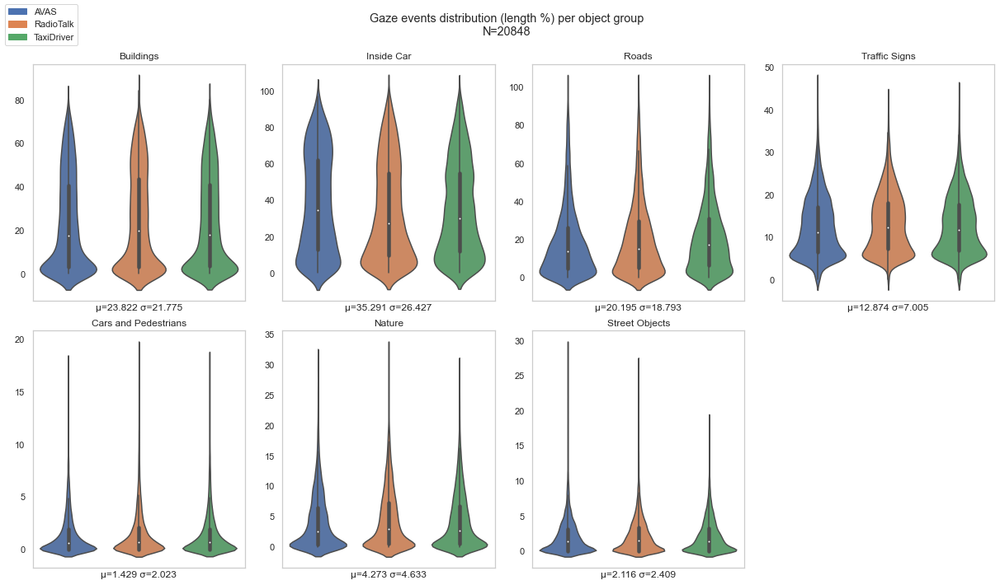

In [43]:
NROWS = 2
NCOLS = 4
N = gaze_levs.index.size

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(17, 10))
fig.suptitle(f"Gaze events distribution (length %) per object group\nN={N}\n")
fig.tight_layout()

# h_cs = hit_cevs.groupby(["condition"])
grp_cats = gaze_levs[
    gaze_levs.columns.difference(["condition"])
].columns.tolist()

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 7:
            grp = grp_cats[i]
            mean = gaze_levs[grp].mean()
            std = gaze_levs[grp].std()
            title_extra = f"μ={mean:.3f} σ={std:.3f}"
            # s = normalize_series(hit_cevs[grp])
            ax = sns.violinplot(
                data=gaze_levs, x="condition", y=grp, ax=axes[r, c]
            )
            i += 1
            # if c != 0:
            #     ax.set_yticklabels([])
            ax.set_ylabel(None)
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp}")
            ax.set_xlabel(title_extra)
            # ax.set_ylim(-10, 110)
            ax.set_xticks([])
            ax.grid(False)

fig.delaxes(axes[1, 3])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
taxi_patch = mpatches.Patch(color=colors[2], label="TaxiDriver")
fig.legend(handles=[avas_patch, radio_patch, taxi_patch], loc="upper left")
plt.show()

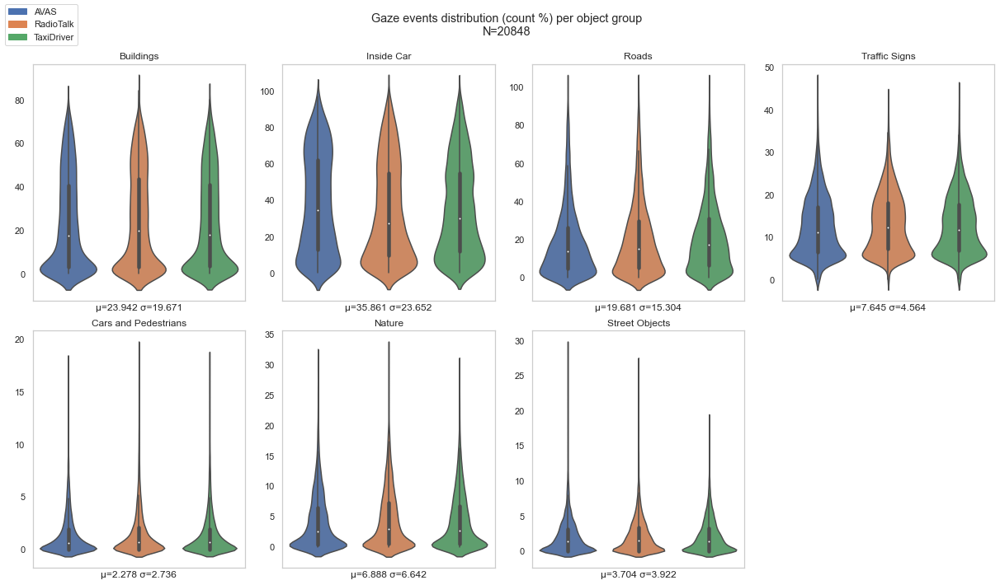

In [44]:
NROWS = 2
NCOLS = 4
N = gaze_cevs.index.size

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(17, 10))
fig.suptitle(f"Gaze events distribution (count %) per object group\nN={N}\n")
fig.tight_layout()

# h_cs = hit_cevs.groupby(["condition"])
grp_cats = gaze_cevs[
    gaze_cevs.columns.difference(["condition"])
].columns.tolist()

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 7:
            grp = grp_cats[i]
            mean = gaze_cevs[grp].mean()
            std = gaze_cevs[grp].std()
            title_extra = f"μ={mean:.3f} σ={std:.3f}"
            # s = normalize_series(hit_cevs[grp])
            ax = sns.violinplot(
                data=gaze_levs, x="condition", y=grp, ax=axes[r, c]
            )
            i += 1
            # if c != 0:
            #     ax.set_yticklabels([])
            ax.set_ylabel(None)
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp}")
            ax.set_xlabel(title_extra)
            # ax.set_ylim(-10, 110)
            ax.set_xticks([])
            ax.grid(False)

fig.delaxes(axes[1, 3])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
taxi_patch = mpatches.Patch(color=colors[2], label="TaxiDriver")
fig.legend(handles=[avas_patch, radio_patch, taxi_patch], loc="upper left")
plt.show()

In [45]:
gaze_levs.describe()

,Buildings,Inside Car,Nature,Cars and Pedestrians,Roads,Street Objects,Traffic Signs
count,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000
mean,23.822,35.291,4.273,1.429,20.195,2.116,12.874
std,21.775,26.427,4.633,2.023,18.793,2.409,7.005
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,3.204,11.417,0.455,0.000,5.549,0.000,6.858
50%,18.169,30.567,2.746,0.649,15.263,1.391,11.796
75%,41.809,57.143,6.889,1.996,29.192,3.269,17.730
max,84.044,100.000,32.171,19.054,100.000,29.047,45.845


In [46]:
gaze_cevs.describe()

,Buildings,Inside Car,Nature,Cars and Pedestrians,Roads,Street Objects,Traffic Signs
count,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000,20848.000
mean,23.942,35.861,6.888,2.278,19.681,3.704,7.645
std,19.671,23.652,6.642,2.736,15.304,3.922,4.564
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,5.405,15.000,1.250,0.000,7.317,0.000,3.896
50%,20.482,33.803,5.195,1.429,17.391,2.740,7.143
75%,40.278,55.882,11.290,3.390,28.947,5.556,10.606
max,78.333,100.000,39.080,20.988,100.000,40.789,32.075


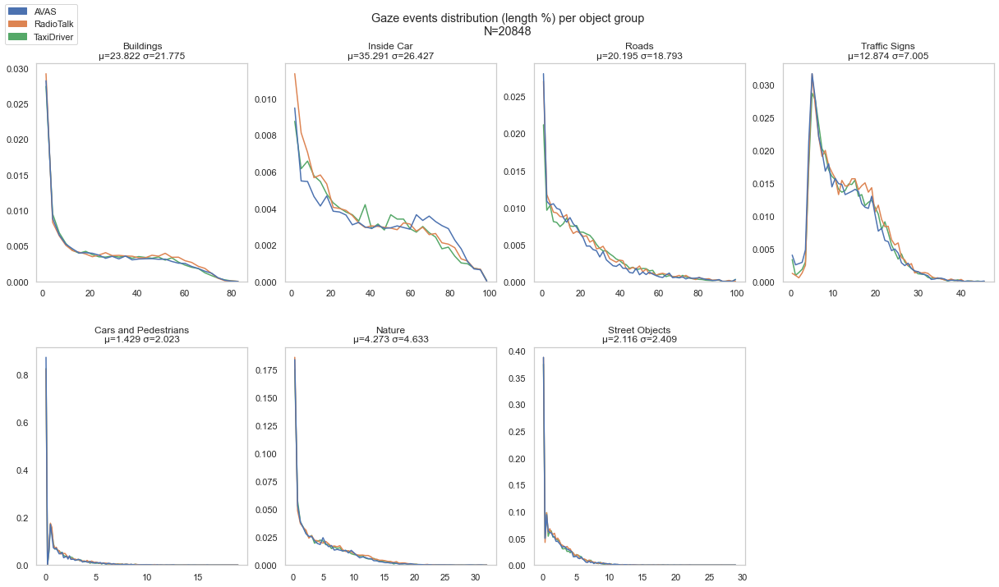

In [47]:
NROWS = 2
NCOLS = 4
N = gaze_levs.index.size

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(17, 10))
fig.suptitle(f"Gaze events distribution (length %) per object group\nN={N}\n")
fig.tight_layout()

# h_cs = hit_cevs.groupby(["condition"])
grp_cats = gaze_levs[
    gaze_levs.columns.difference(["condition"])
].columns.tolist()

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 7:
            grp = grp_cats[i]
            mean = gaze_levs[grp].mean()
            std = gaze_levs[grp].std()
            title_extra = f"μ={mean:.3f} σ={std:.3f}"
            # s = normalize_series(hit_cevs[grp])
            ax = sns.histplot(
                data=gaze_levs,
                hue="condition",
                x=grp,
                # kde=True,
                # multiple="stack",
                element="poly",
                fill=False,
                ax=axes[r, c],
                legend=False,
                stat="density",
            )
            i += 1
            # if c != 0:
            #     ax.set_yticklabels([])
            ax.set_ylabel(None)
            # ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp}\n{title_extra}")
            # ax.set_xlim(0, 10)
            # ax.set_xticks([])
            ax.grid(False)

fig.delaxes(axes[1, 3])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
taxi_patch = mpatches.Patch(color=colors[2], label="TaxiDriver")
fig.legend(handles=[avas_patch, radio_patch, taxi_patch], loc="upper left")
plt.subplots_adjust(hspace=0.3)
plt.show()

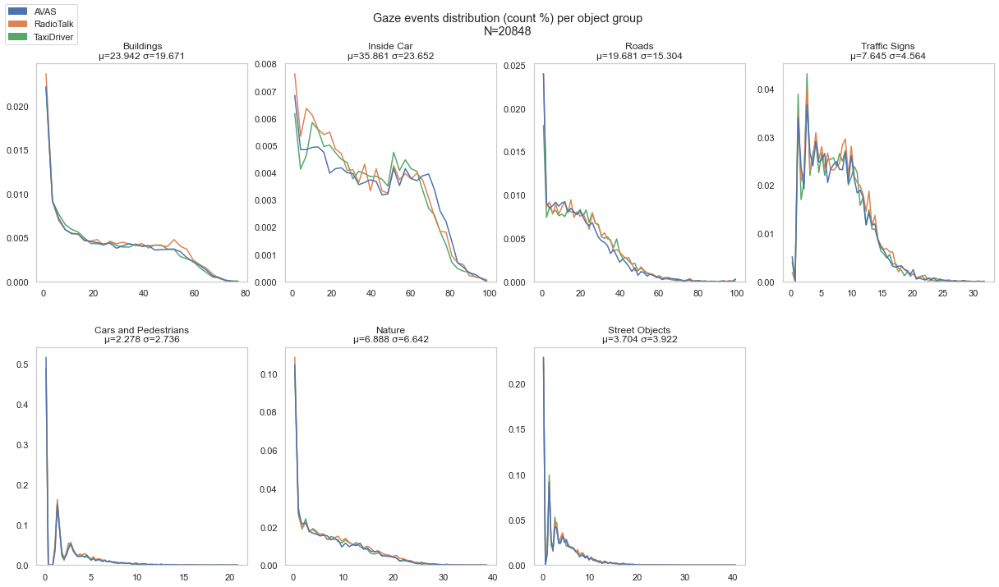

In [48]:
NROWS = 2
NCOLS = 4
N = gaze_cevs.index.size

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(17, 10))
fig.suptitle(f"Gaze events distribution (count %) per object group\nN={N}\n")
fig.tight_layout()

# h_cs = hit_cevs.groupby(["condition"])
grp_cats = gaze_cevs[
    gaze_cevs.columns.difference(["condition"])
].columns.tolist()

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 7:
            grp = grp_cats[i]
            mean = gaze_cevs[grp].mean()
            std = gaze_cevs[grp].std()
            title_extra = f"μ={mean:.3f} σ={std:.3f}"
            # s = normalize_series(hit_cevs[grp])
            ax = sns.histplot(
                data=gaze_cevs,
                hue="condition",
                x=grp,
                # kde=True,
                # multiple="stack",
                element="poly",
                fill=False,
                ax=axes[r, c],
                legend=False,
                stat="density",
            )
            i += 1
            # if c != 0:
            #     ax.set_yticklabels([])
            ax.set_ylabel(None)
            # ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp}\n{title_extra}")
            # ax.set_ylim(-10, 110)
            # ax.set_xticks([])
            ax.grid(False)

fig.delaxes(axes[1, 3])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
taxi_patch = mpatches.Patch(color=colors[2], label="TaxiDriver")
fig.legend(handles=[avas_patch, radio_patch, taxi_patch], loc="upper left")
plt.subplots_adjust(hspace=0.3)
plt.show()

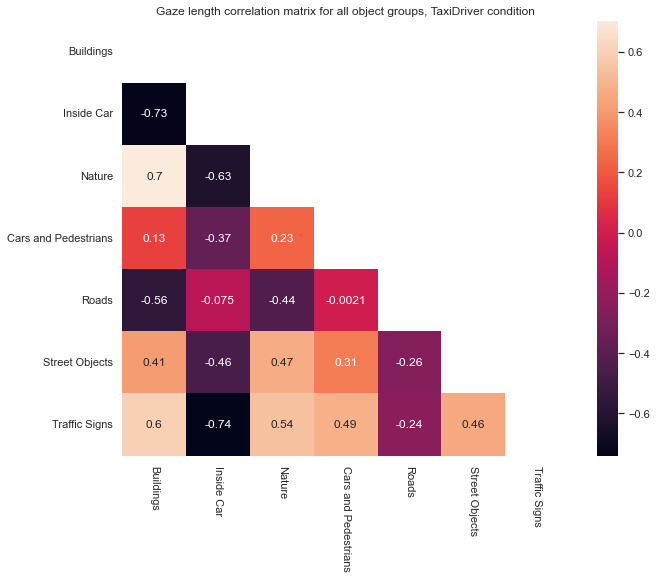

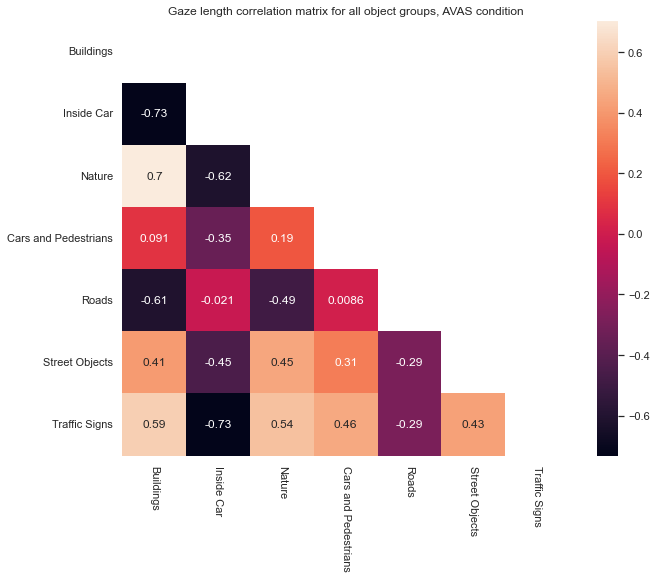

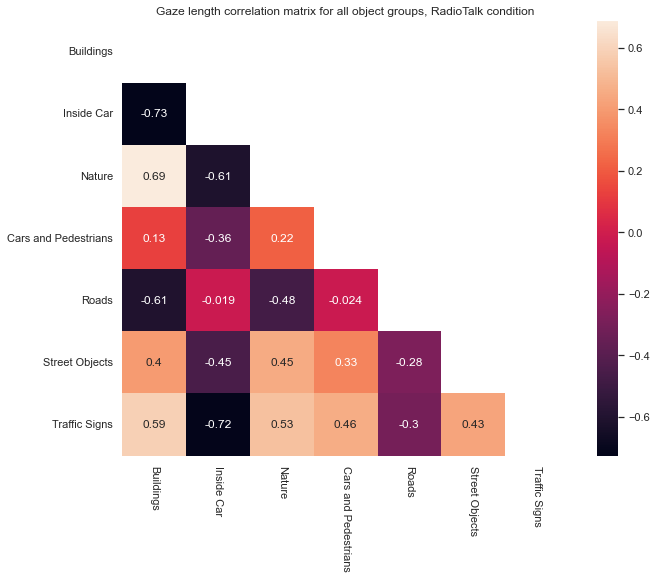

Gaze length variance for all object groups per condition


,TaxiDriver,AVAS,RadioTalk
Buildings,469.499,490.486,460.620
Inside Car,737.328,695.699,651.653
Nature,20.528,22.866,20.868
Cars and Pedestrians,3.988,4.384,3.882
Roads,344.058,366.175,345.181
Street Objects,5.710,5.973,5.714
Traffic Signs,49.467,49.203,48.183


Normality (Gaussian distribution) test:


,TaxiDriver,AVAS,RadioTalk,TaxiDriver Normality,AVAS Normality,RadioTalk Normality
Buildings,0.000,0.000,0.000,❌,❌,❌
Inside Car,0.000,0.000,0.000,❌,❌,❌
Nature,0.000,0.000,0.000,❌,❌,❌
Cars and Pedestrians,0.000,0.000,0.000,❌,❌,❌
Roads,0.000,0.000,0.000,❌,❌,❌
Street Objects,0.000,0.000,0.000,❌,❌,❌
Traffic Signs,0.000,0.000,0.000,❌,❌,❌


Homoscedasticity (Homogeneity of variance) test:


,p-value (Bartlett),Homoscedasticity
Buildings,0.026,❌
Inside Car,0.000,❌
Nature,0.000,❌
Cars and Pedestrians,0.000,❌
Roads,0.013,❌
Street Objects,0.094,✔️
Traffic Signs,0.516,✔️


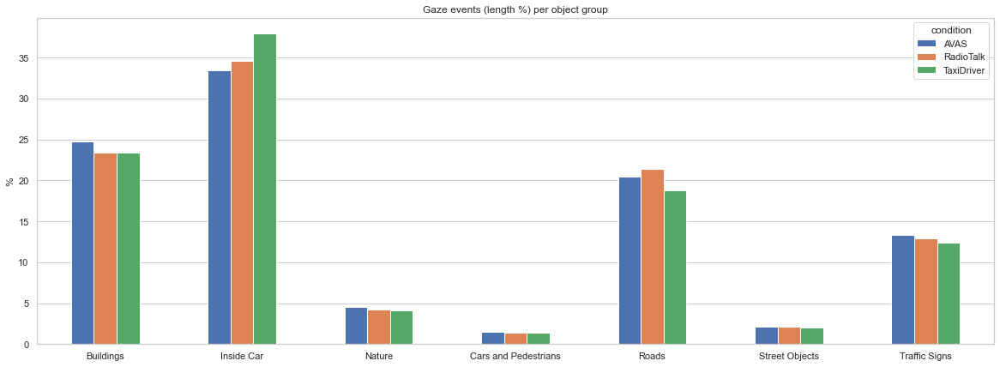

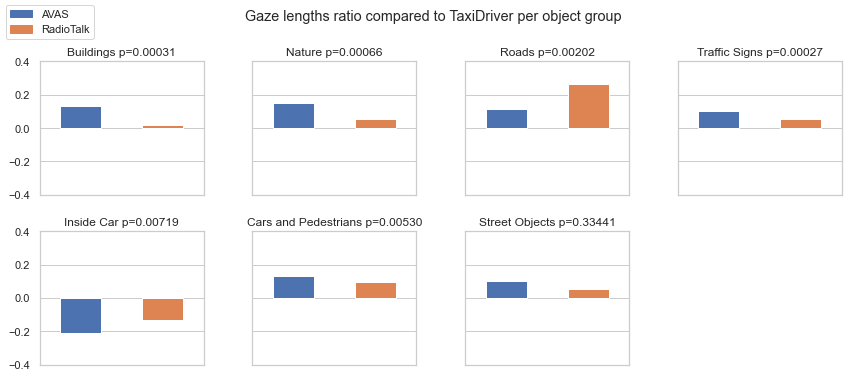

In [49]:
# collect conditions
conds = gaze_levs.condition.unique()

for cond in conds:
    # compute and display a correlation matrix between groups
    corr = gaze_levs[gaze_levs.condition == cond].corr(method="pearson")
    # display(corr)

    # generate a mask to drop the upper part of the matrix (duplicated info)
    mask = np.triu(np.ones_like(corr, dtype=np.bool))

    # figure size
    plt.figure(figsize=(10, 8))

    # display the correlation matrix as a heatmap
    sns.heatmap(corr, annot=True, mask=mask)
    plt.xticks(rotation=-90)
    plt.title(
        f"Gaze length correlation matrix for all object groups, {cond} condition"
    )
    plt.show()

print("Gaze length variance for all object groups per condition")
cond_var = pd.DataFrame(columns=conds)
for cond in conds:
    cond_var[cond] = gaze_levs[gaze_levs.condition == cond].var()
display(cond_var)
# collect and display the variance of each group between conditions
groups = gaze_levs.drop("condition", axis=1).columns
shapiro = pd.DataFrame(columns=conds)
bartlett = pd.DataFrame(columns=["p-value (Bartlett)"])
for grp in groups:
    for cnd in conds:
        shapiro.loc[grp, cnd] = stats.shapiro(
            gaze_levs[gaze_levs.condition == cond][grp]
        )[1]
    bartlett.loc[grp] = stats.bartlett(
        gaze_levs[gaze_levs.condition == "AVAS"][grp],
        gaze_levs[gaze_levs.condition == "TaxiDriver"][grp],
        gaze_levs[gaze_levs.condition == "RadioTalk"][grp],
    )[1]

print("Normality (Gaussian distribution) test:")
for cnd in conds:
    check = shapiro[cnd] > 0.05
    check = ["✔️" if c == True else "❌" for c in check]
    shapiro[f" {cnd} Normality"] = check
display(shapiro)

print("Homoscedasticity (Homogeneity of variance) test:")
check = bartlett["p-value (Bartlett)"] > 0.05
check = ["✔️" if c == True else "❌" for c in check]
bartlett["Homoscedasticity"] = check
display(bartlett)


sns.set(rc={"figure.figsize": (20, 7)})
sns.set_style(STYLE)  # set seaborn plotting style

ax = gaze_levs.groupby(["condition"]).mean().transpose().plot.bar(rot=0)

ax.set_ylabel("%")
ax.xaxis.grid(False)

plt.title("Gaze events (length %) per object group")

plt.show()


NROWS = 2
NCOLS = 4

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(12, 5.5))
fig.suptitle("Gaze lengths ratio compared to TaxiDriver per object group\n")
fig.tight_layout()

groups = gaze_levs.drop("condition", axis=1).columns

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 7:
            grp = groups[i]
            s = normalize_from_condition(
                gaze_levs.groupby(["condition"])[grp].median()
            )
            ax = s.transpose().plot.bar(rot=0, color=colors, ax=axes[r, c])
            # calculate p-value using Welch's t-test (assuming different variance)
            avas = gaze_levs[gaze_levs.condition == "AVAS"][grp]
            radio = gaze_levs[gaze_levs.condition == "RadioTalk"][grp]
            taxi = gaze_levs[gaze_levs.condition == "TaxiDriver"][grp]
            t_test = stats.ttest_ind(avas, radio, equal_var=False)
            i += 1
            if c != 0:
                ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp} p={t_test[1]:.5f}")
            ax.set_ylim(-0.4, 0.4)
            ax.set_xticks([])

fig.delaxes(axes[1, 3])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
fig.legend(handles=[avas_patch, radio_patch], loc="upper left")
plt.show()

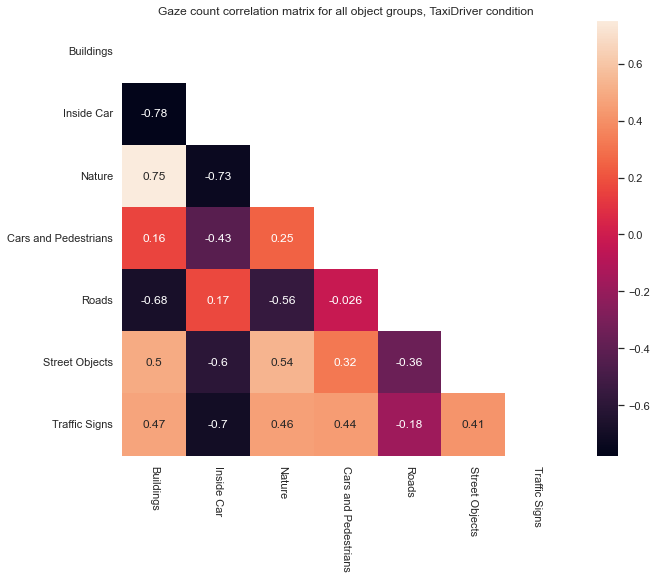

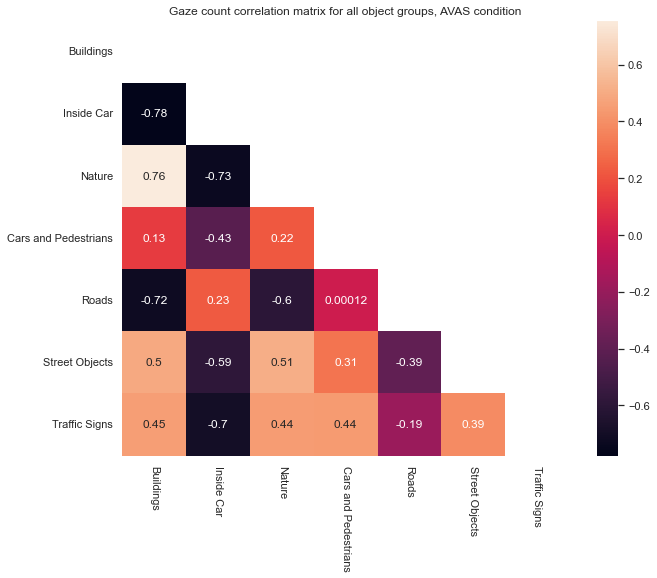

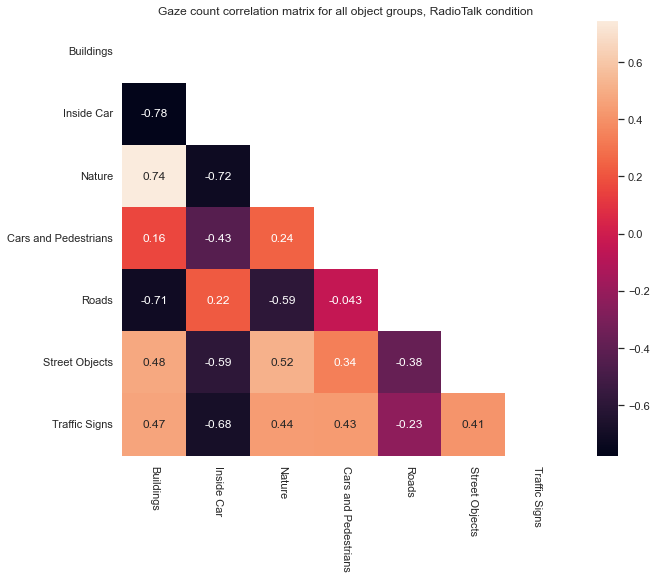

Gaze length variance for all object groups per condition


,TaxiDriver,AVAS,RadioTalk
Buildings,384.936,399.243,375.443
Inside Car,592.360,558.803,523.630
Nature,44.056,45.874,42.267
Cars and Pedestrians,7.623,7.709,7.102
Roads,229.870,238.688,231.780
Street Objects,16.022,15.415,14.717
Traffic Signs,20.998,20.782,20.682


Normality (Gaussian distribution) test:


,TaxiDriver,AVAS,RadioTalk,TaxiDriver Normality,AVAS Normality,RadioTalk Normality
Buildings,0.000,0.000,0.000,❌,❌,❌
Inside Car,0.000,0.000,0.000,❌,❌,❌
Nature,0.000,0.000,0.000,❌,❌,❌
Cars and Pedestrians,0.000,0.000,0.000,❌,❌,❌
Roads,0.000,0.000,0.000,❌,❌,❌
Street Objects,0.000,0.000,0.000,❌,❌,❌
Traffic Signs,0.000,0.000,0.000,❌,❌,❌


Homoscedasticity (Homogeneity of variance) test:


,p-value (Bartlett),Homoscedasticity
Buildings,0.035,❌
Inside Car,0.000,❌
Nature,0.003,❌
Cars and Pedestrians,0.001,❌
Roads,0.251,✔️
Street Objects,0.002,❌
Traffic Signs,0.815,✔️


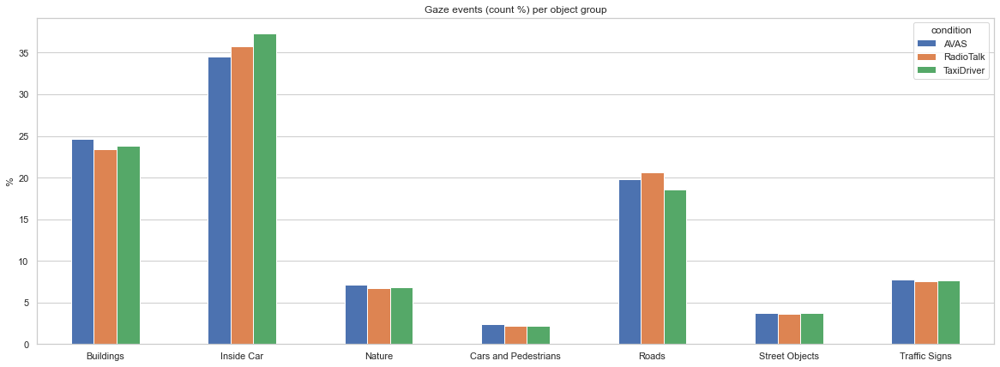

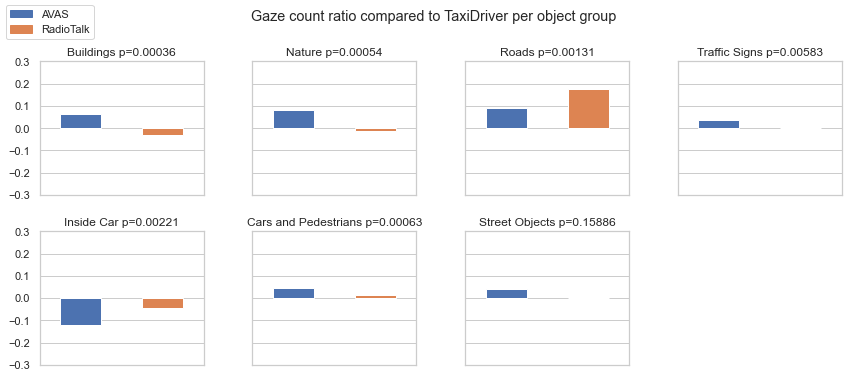

In [50]:
# collect conditions
conds = gaze_cevs.condition.unique()

for cond in conds:
    # compute and display a correlation matrix between groups
    corr = gaze_cevs[gaze_cevs.condition == cond].corr(method="pearson")
    # display(corr)

    # generate a mask to drop the upper part of the matrix (duplicated info)
    mask = np.triu(np.ones_like(corr, dtype=np.bool))

    # figure size
    plt.figure(figsize=(10, 8))

    # display the correlation matrix as a heatmap
    sns.heatmap(corr, annot=True, mask=mask)
    plt.xticks(rotation=-90)
    plt.title(
        f"Gaze count correlation matrix for all object groups, {cond} condition"
    )
    plt.show()

print("Gaze length variance for all object groups per condition")
cond_var = pd.DataFrame(columns=conds)
for cond in conds:
    cond_var[cond] = gaze_cevs[gaze_cevs.condition == cond].var()
display(cond_var)
# collect and display the variance of each group between conditions
groups = gaze_cevs.drop("condition", axis=1).columns
shapiro = pd.DataFrame(columns=conds)
bartlett = pd.DataFrame(columns=["p-value (Bartlett)"])
for grp in groups:
    for cnd in conds:
        shapiro.loc[grp, cnd] = stats.shapiro(
            gaze_cevs[gaze_cevs.condition == cond][grp]
        )[1]
    bartlett.loc[grp] = stats.bartlett(
        gaze_cevs[gaze_cevs.condition == "AVAS"][grp],
        gaze_cevs[gaze_cevs.condition == "TaxiDriver"][grp],
        gaze_cevs[gaze_cevs.condition == "RadioTalk"][grp],
    )[1]

print("Normality (Gaussian distribution) test:")
for cnd in conds:
    check = shapiro[cnd] > 0.05
    check = ["✔️" if c == True else "❌" for c in check]
    shapiro[f" {cnd} Normality"] = check
display(shapiro)

print("Homoscedasticity (Homogeneity of variance) test:")
check = bartlett["p-value (Bartlett)"] > 0.05
check = ["✔️" if c == True else "❌" for c in check]
bartlett["Homoscedasticity"] = check
display(bartlett)

sns.set(rc={"figure.figsize": (20, 7)})
sns.set_style(STYLE)  # set seaborn plotting style

ax = gaze_cevs.groupby(["condition"]).mean().transpose().plot.bar(rot=0)

ax.set_ylabel("%")
ax.xaxis.grid(False)

plt.title("Gaze events (count %) per object group")

plt.show()


NROWS = 2
NCOLS = 4

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(12, 5.5))
fig.suptitle("Gaze count ratio compared to TaxiDriver per object group\n")
fig.tight_layout()

groups = gaze_cevs.drop("condition", axis=1).columns

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if i < 7:
            grp = groups[i]
            s = normalize_from_condition(
                gaze_cevs.groupby(["condition"])[grp].median()
            )
            ax = s.transpose().plot.bar(rot=0, color=colors, ax=axes[r, c])
            # calculate p-value using Welch's t-test (assuming different variance)
            avas = gaze_cevs[gaze_cevs.condition == "AVAS"][grp]
            radio = gaze_cevs[gaze_cevs.condition == "RadioTalk"][grp]
            taxi = gaze_cevs[gaze_cevs.condition == "TaxiDriver"][grp]
            t_test = stats.ttest_ind(avas, radio, equal_var=False)
            i += 1
            if c != 0:
                ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp} p={t_test[1]:.5f}")
            ax.set_ylim(-0.3, 0.3)
            ax.set_xticks([])

fig.delaxes(axes[1, 3])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
fig.legend(handles=[avas_patch, radio_patch], loc="upper left")
plt.show()

TR vs non-TR

Gaze length variance for all object groups per condition


,TaxiDriver,AVAS,RadioTalk
TR,804.825,810.725,766.632
non-TR,804.825,810.450,765.655


Normality (Gaussian distribution) test:


,TaxiDriver,AVAS,RadioTalk,TaxiDriver Normality,AVAS Normality,RadioTalk Normality
TR,0.000,0.000,0.000,❌,❌,❌
non-TR,0.000,0.000,0.000,❌,❌,❌


Homoscedasticity (Homogeneity of variance) test:


,p-value (Bartlett),Homoscedasticity
TR,0.041,❌
non-TR,0.036,❌


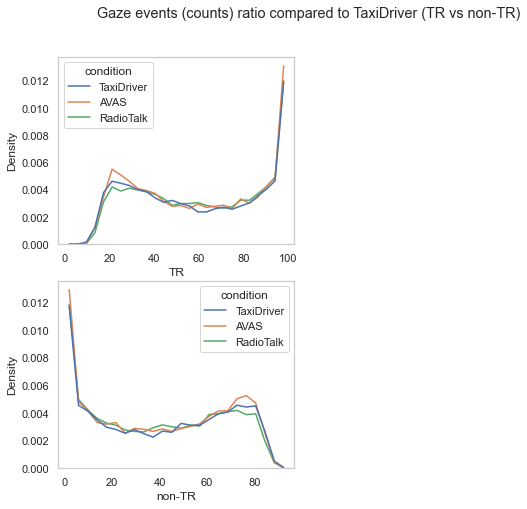

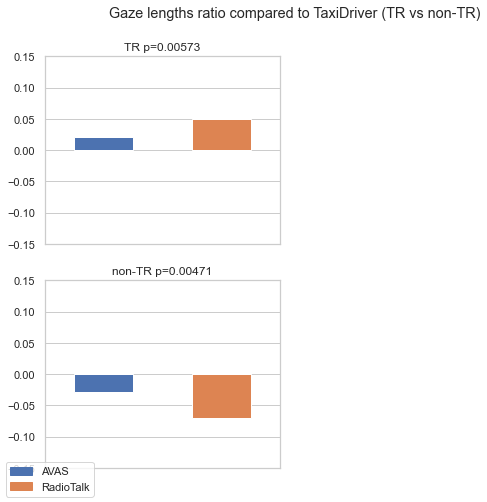

In [51]:
print("Gaze length variance for all object groups per condition")
cond_var = pd.DataFrame(columns=conds)
for cond in conds:
    cond_var[cond] = gaze_ltr[gaze_ltr.condition == cond].var()
display(cond_var)
# collect and display the variance of each group between conditions
groups = gaze_ltr.drop("condition", axis=1).columns
shapiro = pd.DataFrame(columns=conds)
bartlett = pd.DataFrame(columns=["p-value (Bartlett)"])
for grp in groups:
    for cnd in conds:
        shapiro.loc[grp, cnd] = stats.shapiro(
            gaze_ltr[gaze_ltr.condition == cond][grp]
        )[1]
    bartlett.loc[grp] = stats.bartlett(
        gaze_ltr[gaze_ltr.condition == "AVAS"][grp],
        gaze_ltr[gaze_ltr.condition == "TaxiDriver"][grp],
        gaze_ltr[gaze_ltr.condition == "RadioTalk"][grp],
    )[1]

print("Normality (Gaussian distribution) test:")
for cnd in conds:
    check = shapiro[cnd] > 0.05
    check = ["✔️" if c == True else "❌" for c in check]
    shapiro[f" {cnd} Normality"] = check
display(shapiro)

print("Homoscedasticity (Homogeneity of variance) test:")
check = bartlett["p-value (Bartlett)"] > 0.05
check = ["✔️" if c == True else "❌" for c in check]
bartlett["Homoscedasticity"] = check
display(bartlett)

NROWS = 2
NCOLS = 2


fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(8, 7))
fig.suptitle(
    "Gaze events (counts) ratio compared to TaxiDriver (TR vs non-TR)\n"
)
fig.tight_layout()

groups = gaze_ltr.drop("condition", axis=1).columns

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if c < 1:
            # grp = grp_cats[i]
            # mean = gaze_ltr[grp].mean()
            # std = gaze_ltr[grp].std()
            # title_extra = f"μ={mean:.3f} σ={std:.3f}"
            # s = normalize_series(hit_cevs[grp])
            ax = sns.histplot(
                data=gaze_ltr,
                hue="condition",
                x=groups[i],
                # kde=True,
                # multiple="stack",
                element="poly",
                fill=False,
                ax=axes[r, c],
                legend=True,
                stat="density",
            )
            i += 1
            # if c != 0:
            #     ax.set_yticklabels([])
            # ax.set_ylabel(None)
            # ax.set_xticklabels([])
            # ax.set_xlabel(None)
            # ax.set_title(f"{grp}\n{title_extra}")
            # ax.set_ylim(-10, 110)
            # ax.set_xticks([])
            ax.grid(False)

fig.delaxes(axes[1, 1])
fig.delaxes(axes[0, 1])
# avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
# radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
# fig.legend(handles=[avas_patch, radio_patch], loc="lower left")
plt.show()


NROWS = 2
NCOLS = 2

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(8, 7))
fig.suptitle("Gaze lengths ratio compared to TaxiDriver (TR vs non-TR)\n")
fig.tight_layout()

groups = gaze_ltr.drop("condition", axis=1).columns

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if c < 1:
            grp = groups[i]
            s = normalize_from_condition(
                gaze_ltr.groupby(["condition"])[grp].median()
            )
            ax = s.transpose().plot.bar(rot=0, color=colors, ax=axes[r, c])
            # calculate p-value using Welch's t-test (assuming different variance)
            avas = gaze_ltr[gaze_ltr.condition == "AVAS"][grp]
            radio = gaze_ltr[gaze_ltr.condition == "RadioTalk"][grp]
            taxi = gaze_ltr[gaze_ltr.condition == "TaxiDriver"][grp]
            t_test = stats.ttest_ind(avas, radio, equal_var=True)
            i += 1
            if c != 0:
                ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp} p={t_test[1]:.5f}")
            ax.set_ylim(-0.15, 0.15)
            ax.set_xticks([])

fig.delaxes(axes[1, 1])
fig.delaxes(axes[0, 1])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
fig.legend(handles=[avas_patch, radio_patch], loc="lower left")
plt.show()

Gaze length variance for all object groups per condition


,TaxiDriver,AVAS,RadioTalk
TR,859.560,871.136,826.025
non-TR,859.560,871.049,825.650


Normality (Gaussian distribution) test:


,TaxiDriver,AVAS,RadioTalk,TaxiDriver Normality,AVAS Normality,RadioTalk Normality
TR,0.000,0.000,0.000,❌,❌,❌
non-TR,0.000,0.000,0.000,❌,❌,❌


Homoscedasticity (Homogeneity of variance) test:


,p-value (Bartlett),Homoscedasticity
TR,0.071,✔️
non-TR,0.068,✔️


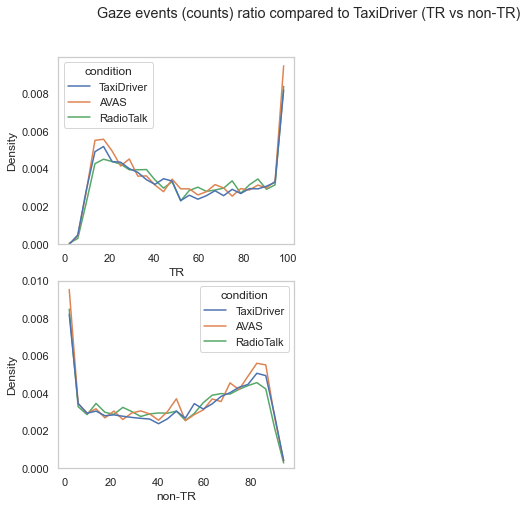

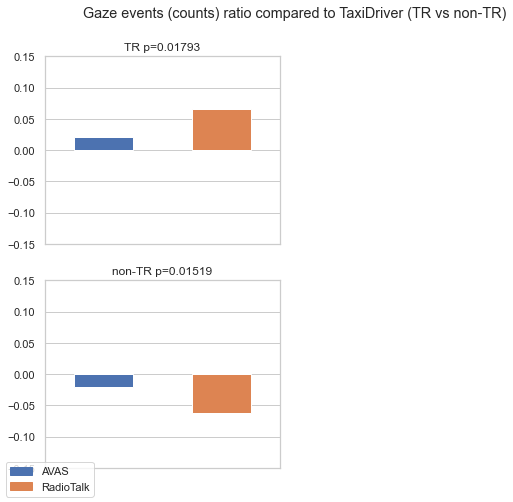

In [52]:
print("Gaze length variance for all object groups per condition")
cond_var = pd.DataFrame(columns=conds)
for cond in conds:
    cond_var[cond] = gaze_ctr[gaze_ctr.condition == cond].var()
display(cond_var)
# collect and display the variance of each group between conditions
groups = gaze_ctr.drop("condition", axis=1).columns
shapiro = pd.DataFrame(columns=conds)
bartlett = pd.DataFrame(columns=["p-value (Bartlett)"])
for grp in groups:
    for cnd in conds:
        shapiro.loc[grp, cnd] = stats.shapiro(
            gaze_ctr[gaze_ctr.condition == cond][grp]
        )[1]
    bartlett.loc[grp] = stats.bartlett(
        gaze_ctr[gaze_ctr.condition == "AVAS"][grp],
        gaze_ctr[gaze_ctr.condition == "TaxiDriver"][grp],
        gaze_ctr[gaze_ctr.condition == "RadioTalk"][grp],
    )[1]

print("Normality (Gaussian distribution) test:")
for cnd in conds:
    check = shapiro[cnd] > 0.05
    check = ["✔️" if c == True else "❌" for c in check]
    shapiro[f" {cnd} Normality"] = check
display(shapiro)

print("Homoscedasticity (Homogeneity of variance) test:")
check = bartlett["p-value (Bartlett)"] > 0.05
check = ["✔️" if c == True else "❌" for c in check]
bartlett["Homoscedasticity"] = check
display(bartlett)

NROWS = 2
NCOLS = 2


fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(8, 7))
fig.suptitle(
    "Gaze events (counts) ratio compared to TaxiDriver (TR vs non-TR)\n"
)
fig.tight_layout()

groups = gaze_ctr.drop("condition", axis=1).columns

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if c < 1:
            # grp = grp_cats[i]
            # mean = gaze_ltr[grp].mean()
            # std = gaze_ltr[grp].std()
            # title_extra = f"μ={mean:.3f} σ={std:.3f}"
            # s = normalize_series(hit_cevs[grp])
            ax = sns.histplot(
                data=gaze_ctr,
                hue="condition",
                x=groups[i],
                # kde=True,
                # multiple="stack",
                element="poly",
                fill=False,
                ax=axes[r, c],
                legend=True,
                stat="density",
            )
            i += 1
            # if c != 0:
            #     ax.set_yticklabels([])
            # ax.set_ylabel(None)
            # ax.set_xticklabels([])
            # ax.set_xlabel(None)
            # ax.set_title(f"{grp}\n{title_extra}")
            # ax.set_ylim(-10, 110)
            # ax.set_xticks([])
            ax.grid(False)

fig.delaxes(axes[1, 1])
fig.delaxes(axes[0, 1])
# avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
# radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
# fig.legend(handles=[avas_patch, radio_patch], loc="lower left")
plt.show()


NROWS = 2
NCOLS = 2

fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(8, 7))
fig.suptitle(
    "Gaze events (counts) ratio compared to TaxiDriver (TR vs non-TR)\n"
)
fig.tight_layout()

groups = gaze_ctr.drop("condition", axis=1).columns

i = 0
for c in range(NCOLS):
    for r in range(NROWS):
        if c < 1:
            grp = groups[i]
            s = normalize_from_condition(
                gaze_ctr.groupby(["condition"])[grp].median()
            )
            ax = s.transpose().plot.bar(rot=0, color=colors, ax=axes[r, c])
            # calculate p-value using Welch's t-test (assuming different variance)
            avas = gaze_ctr[gaze_ctr.condition == "AVAS"][grp]
            radio = gaze_ctr[gaze_ctr.condition == "RadioTalk"][grp]
            taxi = gaze_ctr[gaze_ctr.condition == "TaxiDriver"][grp]
            t_test = stats.ttest_ind(avas, radio, equal_var=True)
            i += 1
            if c != 0:
                ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.set_xlabel(None)
            ax.set_title(f"{grp} p={t_test[1]:.5f}")
            ax.set_ylim(-0.15, 0.15)
            ax.set_xticks([])

fig.delaxes(axes[1, 1])
fig.delaxes(axes[0, 1])
avas_patch = mpatches.Patch(color=colors[0], label="AVAS")
radio_patch = mpatches.Patch(color=colors[1], label="RadioTalk")
fig.legend(handles=[avas_patch, radio_patch], loc="lower left")
plt.show()

In [53]:
parts

,date,expo,side,condition,questionnaire,nulls_%
id,,,,,,
4f583872ffed48249874b00f3d389cfc,2019-05-14 13:21:00,MSW,right,TaxiDriver,No,1.610
33d68ad55ef544fab9fd08108e3913ca,2019-05-14 16:44:00,MSW,right,AVAS,No,0.037
37d7e67934974217830bb429bba7fd76,2019-05-14 16:54:00,MSW,left,AVAS,No,0.824
9cdd85098b0b4ad5ab2282a5ac371a5e,2019-05-14 16:59:00,MSW,right,AVAS,No,0.000
ff846d92c7e6471183595bd2678f29f6,2019-05-14 17:37:00,MSW,right,AVAS,No,0.037
...,...,...,...,...,...,...
dba04b626e4c4c6e89aea4fb1f9cc32b,2019-12-30 13:48:00,BMBF,left,TaxiDriver,Yes,0.000
611d35a7c3e940cc82495e53c2a8532d,2020-01-03 16:12:00,BMBF,right,TaxiDriver,No,0.674
3b6fda285d9e412eb081986b2f22a2e3,2020-01-03 16:13:00,BMBF,left,AVAS,No,1.797


In [54]:
parts[parts.questionnaire == "Yes"].index.size

8207

In [55]:
quests.index.size

8207

In [56]:
select = parts[parts.questionnaire == "Yes"]
gaze_ltr = gaze_ltr.join(parts[["expo", "side", "questionnaire"]], how="outer")
select = gaze_ltr[gaze_ltr.questionnaire == "Yes"]
cols = [
    "Intention",
    "Usefulness",
    "Ease",
    "Trust",
    "Gender",
    "Age",
    "Aviophobia",
    "Driving",
    "Play",
    "VR",
]
gaze_ltr = gaze_ltr.join(quests[cols], how="outer")

In [57]:
gaze_ltr = gaze_ltr[gaze_ltr.questionnaire == "Yes"]
gaze_ltr

,TR,non-TR,condition,expo,side,questionnaire,Intention,Usefulness,Ease,Trust,Gender,Age,Aviophobia,Driving,Play,VR
000966a73bce402d8d92ece7eb13e1f7,53.320,46.680,AVAS,BMBF,right,Yes,50.000,50.000,50.000,68.000,Female,15.000,0.000,0.000,4.000,once
000ea0a15c0d476f89d084116e7b1e86,88.186,11.814,AVAS,MSW,right,Yes,88.000,56.000,25.000,100.000,Male,12.000,0.000,0.000,9.000,less than 10 times
0015a3c9144248fb9571311e1140d7d0,52.035,47.965,AVAS,MSW,right,Yes,71.000,50.000,83.000,50.000,Male,23.000,1.000,4.000,4.000,more than 10 times
001f482723604d929eff67b8e59f1db1,39.167,60.833,RadioTalk,MSW,left,Yes,37.000,39.000,45.000,100.000,N/A,81.000,0.000,0.000,5.000,less than 10 times
002063c0fd864a8c93fb114faee6417b,86.519,13.481,TaxiDriver,MSW,left,Yes,77.000,100.000,100.000,100.000,Female,14.000,0.000,0.000,1.000,once
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ffe8b0db1e4640d695641d7b6bd2099d,24.297,75.703,TaxiDriver,MSW,right,Yes,100.000,100.000,100.000,100.000,Male,17.000,0.000,0.000,50.000,more than 10 times
ffeaa9becd4f451389d253b8ac0ba1bc,22.308,77.692,AVAS,MSW,left,Yes,83.000,0.000,87.000,61.000,Female,12.000,0.000,0.000,2.000,less than 10 times
fff21f23099e4e70b09ebc727e6365e5,100.000,0.000,AVAS,MSW,left,Yes,50.000,50.000,56.000,89.000,Male,19.000,0.000,0.000,30.000,once
fff77d4abc9b4937a78f5e4a8b9def12,100.000,0.000,TaxiDriver,MSW,right,Yes,50.000,30.000,100.000,50.000,Male,46.000,0.000,27.000,0.000,less than 10 times


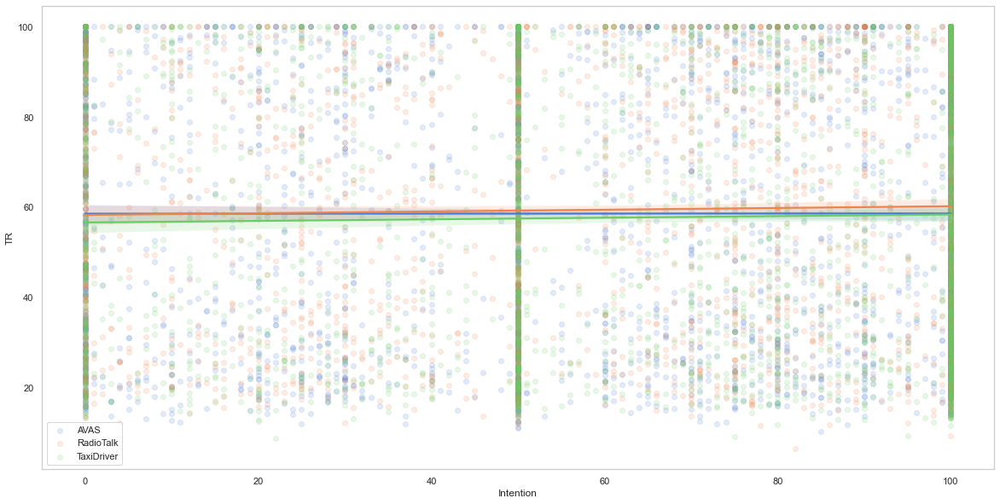

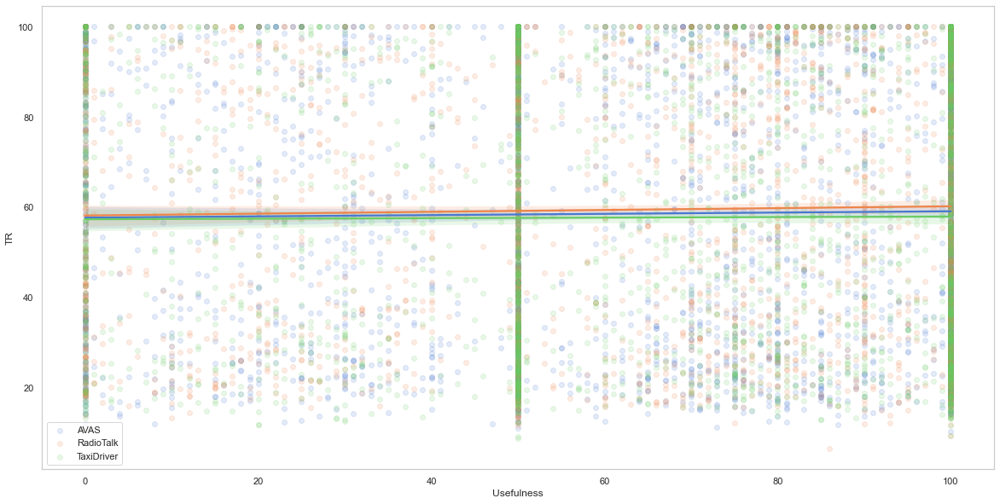

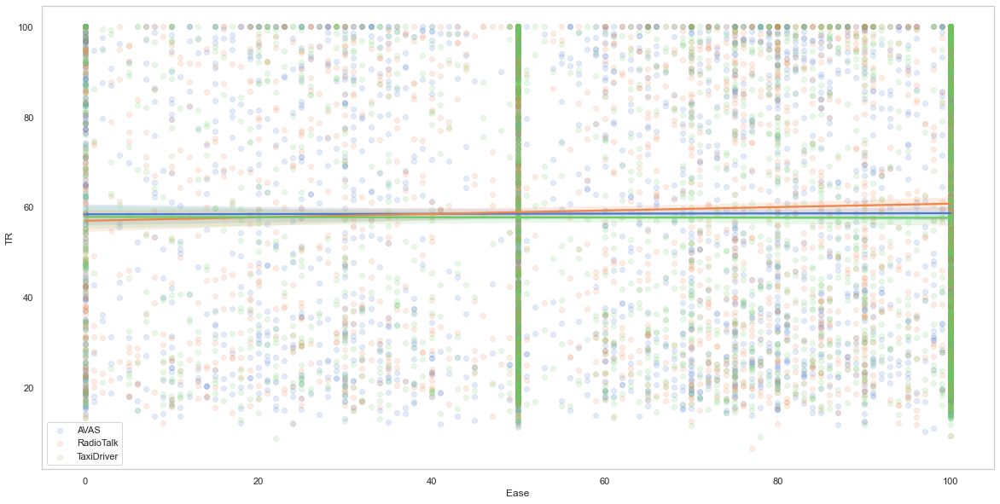

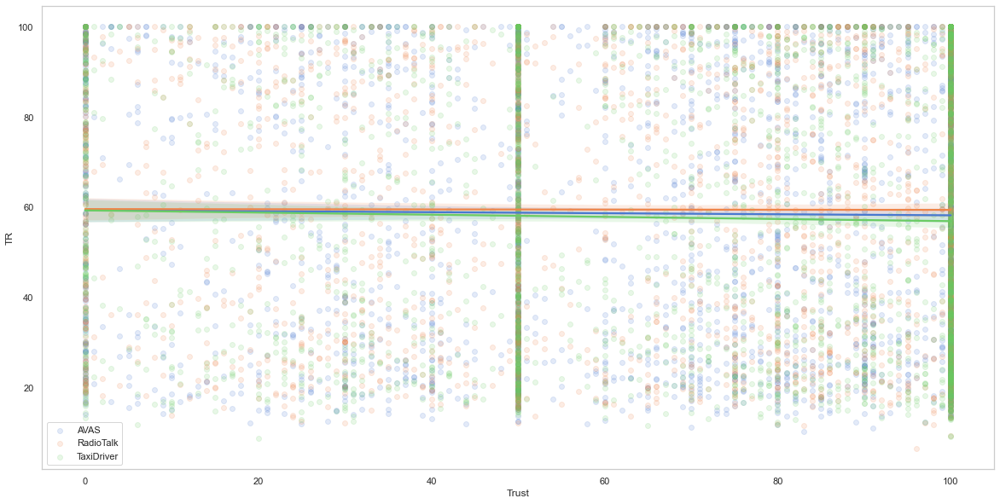

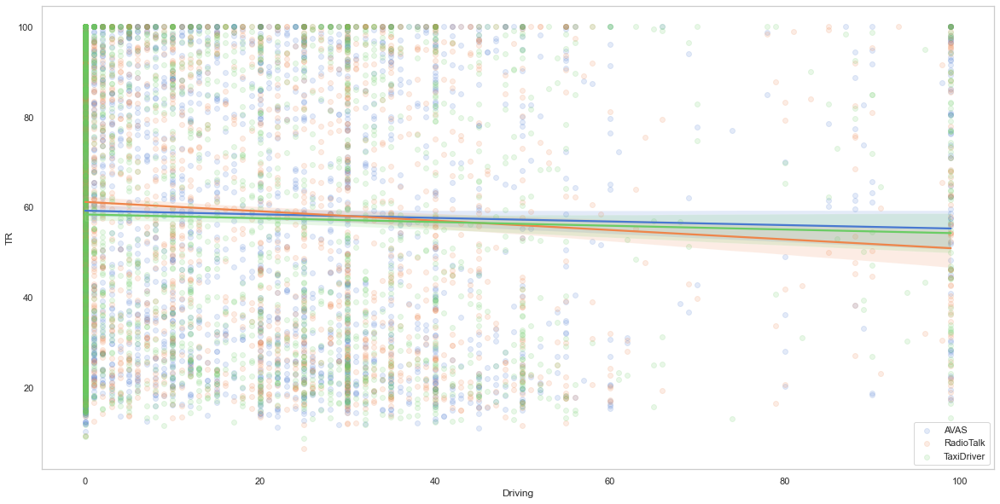

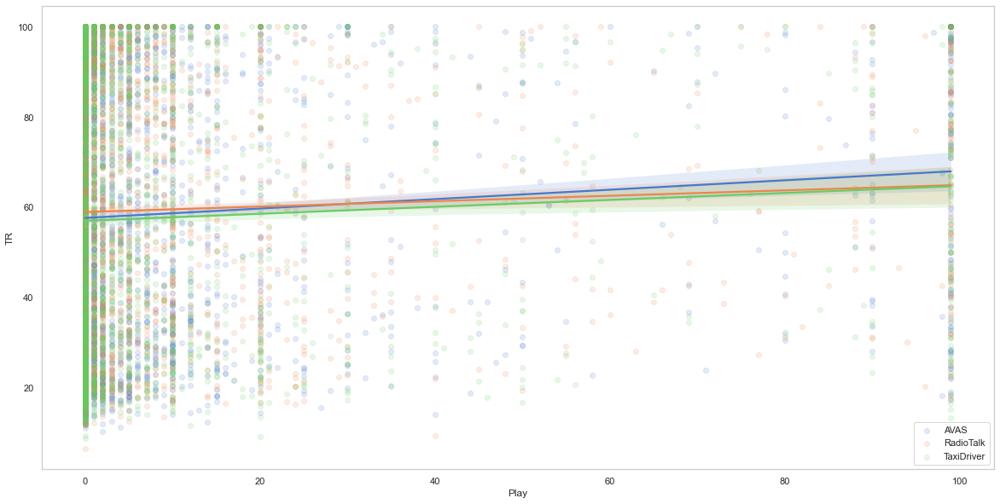

In [58]:
# palette = itertools.cycle(sns.color_palette(palette="muted"))  # color palette
cols = [
    "Intention",
    "Usefulness",
    "Ease",
    "Trust",
    # "Aviophobia",
    "Driving",
    "Play",
]
conds = ["AVAS", "RadioTalk", "TaxiDriver"]
for col in cols:
    palette = itertools.cycle(
        sns.color_palette(palette="muted")
    )  # color palette
    plt.figure(figsize=(20, 10))
    for cnd in conds:
        ax = sns.regplot(
            data=gaze_ltr[gaze_ltr.condition == cnd],
            y="TR",
            x=col,
            color=next(palette),
            label=cnd,
            scatter_kws={"alpha": 0.15},
        )
        ax.grid(False)
    plt.legend()
    plt.show()

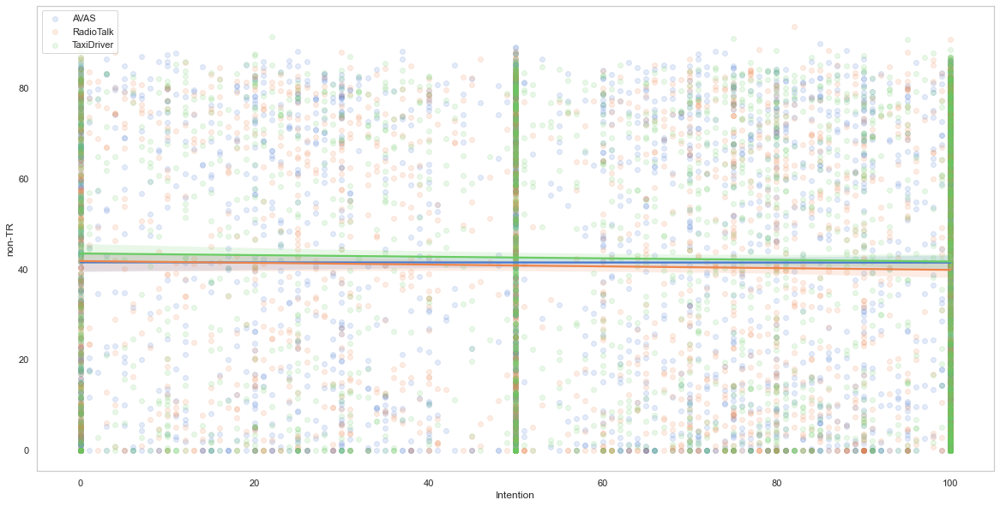

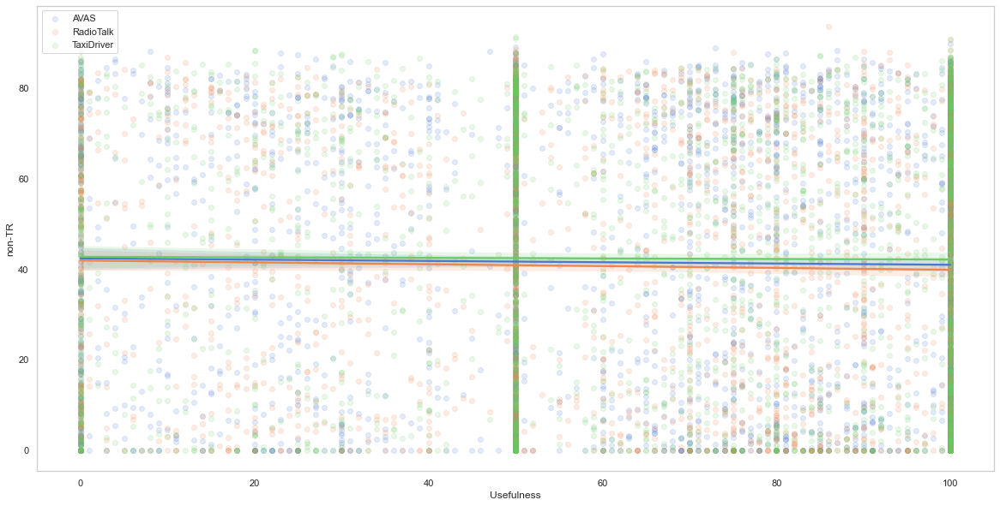

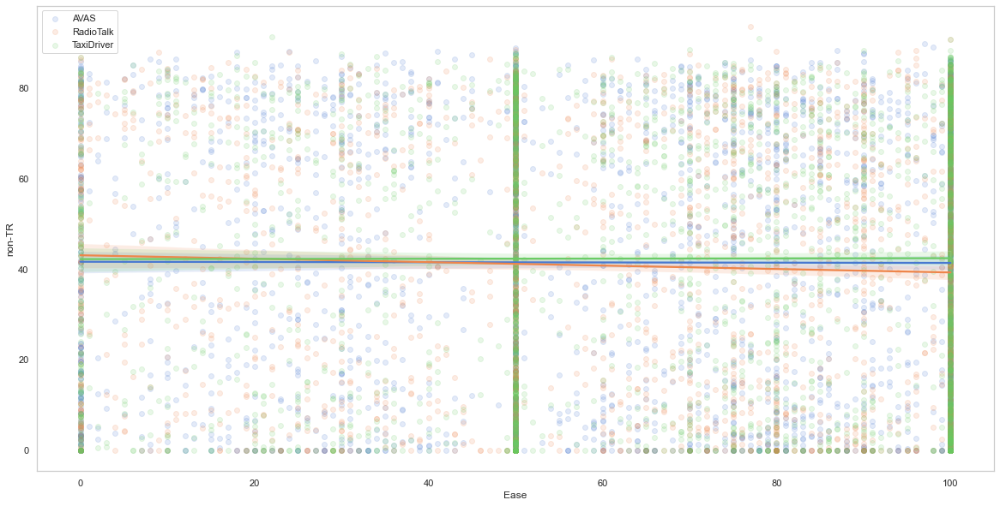

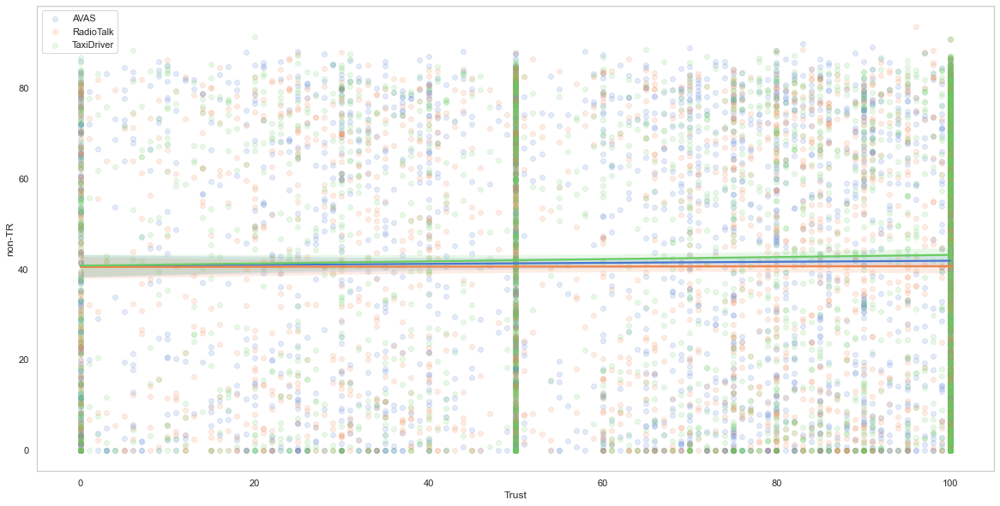

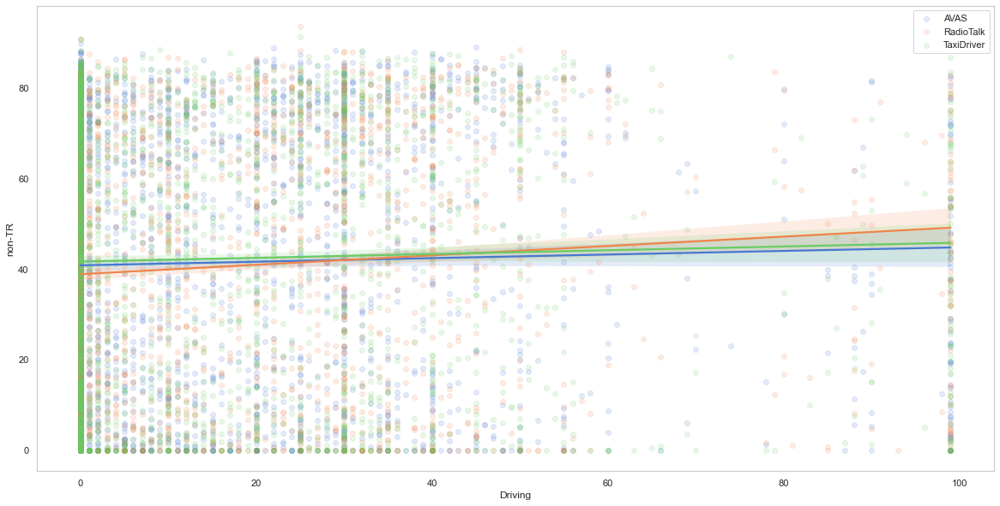

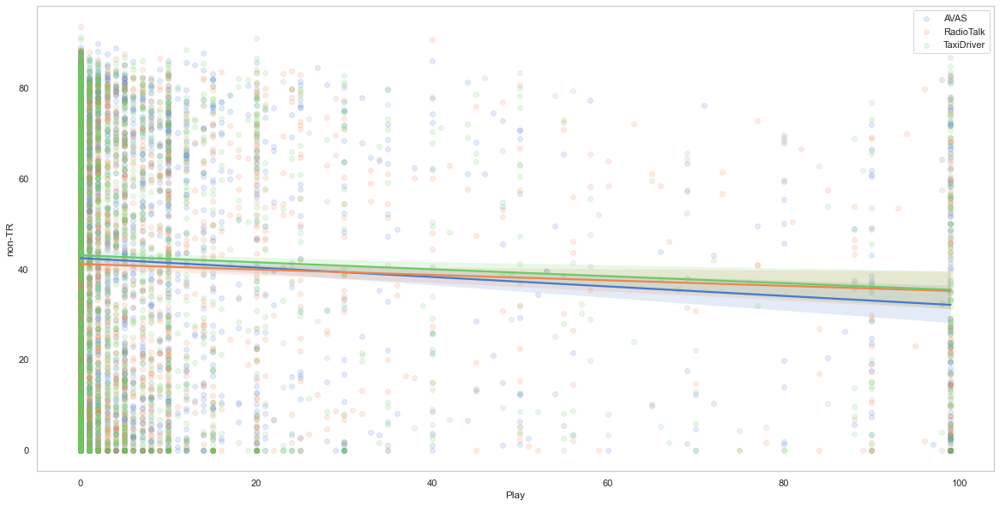

In [59]:
# palette = itertools.cycle(sns.color_palette(palette="muted"))  # color palette
cols = [
    "Intention",
    "Usefulness",
    "Ease",
    "Trust",
    # "Aviophobia",
    "Driving",
    "Play",
]
conds = ["AVAS", "RadioTalk", "TaxiDriver"]
for col in cols:
    palette = itertools.cycle(
        sns.color_palette(palette="muted")
    )  # color palette
    plt.figure(figsize=(20, 10))
    for cnd in conds:
        ax = sns.regplot(
            data=gaze_ltr[gaze_ltr.condition == cnd],
            y="non-TR",
            x=col,
            color=next(palette),
            label=cnd,
            scatter_kws={"alpha": 0.15},
        )
    ax.grid(False)
    plt.legend()
    plt.show()

In [60]:
select = parts[parts.questionnaire == "Yes"]
gaze_ctr = gaze_ctr.join(
    select[["expo", "side", "questionnaire"]], how="outer"
)
# select = gaze_ctr[gaze_ctr.questionnaire == "Yes"]
cols = [
    "Intention",
    "Usefulness",
    "Ease",
    "Trust",
    "Gender",
    "Age",
    # "Aviophobia",
    "Driving",
    "Play",
    "VR",
]
gaze_ctr = gaze_ctr.join(quests[cols], how="outer")
gaze_ctr

,TR,non-TR,condition,expo,side,questionnaire,Intention,Usefulness,Ease,Trust,Gender,Age,Driving,Play,VR
0002d624d34c44369f109d1c5d076d1b,54.000,46.000,TaxiDriver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
00040aa093c944f98a5c2f9ef515782a,100.000,0.000,AVAS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
000506554eb6453f94b51947d824731c,21.311,78.689,AVAS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0007826f6d5a4bc8a4bf504f0f53a69f,100.000,0.000,TaxiDriver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
000966a73bce402d8d92ece7eb13e1f7,54.545,45.455,AVAS,BMBF,right,Yes,50.000,50.000,50.000,68.000,Female,15.000,0.000,4.000,once
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fff1761cade0489193486fb5191b47a9,100.000,0.000,AVAS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
fff21f23099e4e70b09ebc727e6365e5,100.000,0.000,AVAS,MSW,left,Yes,50.000,50.000,56.000,89.000,Male,19.000,0.000,30.000,once
fff77d4abc9b4937a78f5e4a8b9def12,100.000,0.000,TaxiDriver,MSW,right,Yes,50.000,30.000,100.000,50.000,Male,46.000,27.000,0.000,less than 10 times
fffb6dd07f9c469aaf2fdb1272f154ec,42.105,57.895,AVAS,MSW,right,Yes,50.000,20.000,33.000,36.000,Male,14.000,0.000,15.000,less than 10 times


In [61]:
gaze_ctr = gaze_ctr[gaze_ctr.questionnaire == "Yes"]
gaze_ctr

,TR,non-TR,condition,expo,side,questionnaire,Intention,Usefulness,Ease,Trust,Gender,Age,Driving,Play,VR
000966a73bce402d8d92ece7eb13e1f7,54.545,45.455,AVAS,BMBF,right,Yes,50.000,50.000,50.000,68.000,Female,15.000,0.000,4.000,once
000ea0a15c0d476f89d084116e7b1e86,86.957,13.043,AVAS,MSW,right,Yes,88.000,56.000,25.000,100.000,Male,12.000,0.000,9.000,less than 10 times
0015a3c9144248fb9571311e1140d7d0,52.727,47.273,AVAS,MSW,right,Yes,71.000,50.000,83.000,50.000,Male,23.000,4.000,4.000,more than 10 times
001f482723604d929eff67b8e59f1db1,30.952,69.048,RadioTalk,MSW,left,Yes,37.000,39.000,45.000,100.000,N/A,81.000,0.000,5.000,less than 10 times
002063c0fd864a8c93fb114faee6417b,77.419,22.581,TaxiDriver,MSW,left,Yes,77.000,100.000,100.000,100.000,Female,14.000,0.000,1.000,once
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ffe8b0db1e4640d695641d7b6bd2099d,13.115,86.885,TaxiDriver,MSW,right,Yes,100.000,100.000,100.000,100.000,Male,17.000,0.000,50.000,more than 10 times
ffeaa9becd4f451389d253b8ac0ba1bc,9.231,90.769,AVAS,MSW,left,Yes,83.000,0.000,87.000,61.000,Female,12.000,0.000,2.000,less than 10 times
fff21f23099e4e70b09ebc727e6365e5,100.000,0.000,AVAS,MSW,left,Yes,50.000,50.000,56.000,89.000,Male,19.000,0.000,30.000,once
fff77d4abc9b4937a78f5e4a8b9def12,100.000,0.000,TaxiDriver,MSW,right,Yes,50.000,30.000,100.000,50.000,Male,46.000,27.000,0.000,less than 10 times


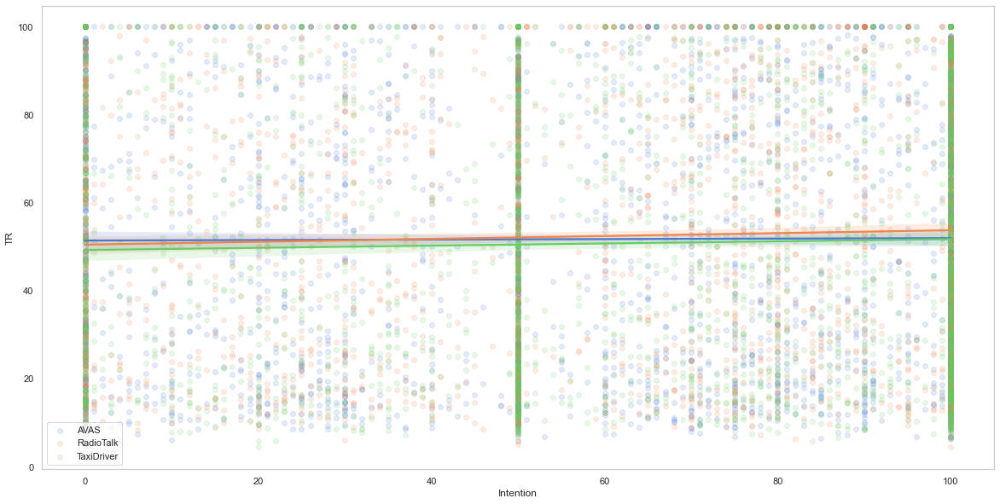

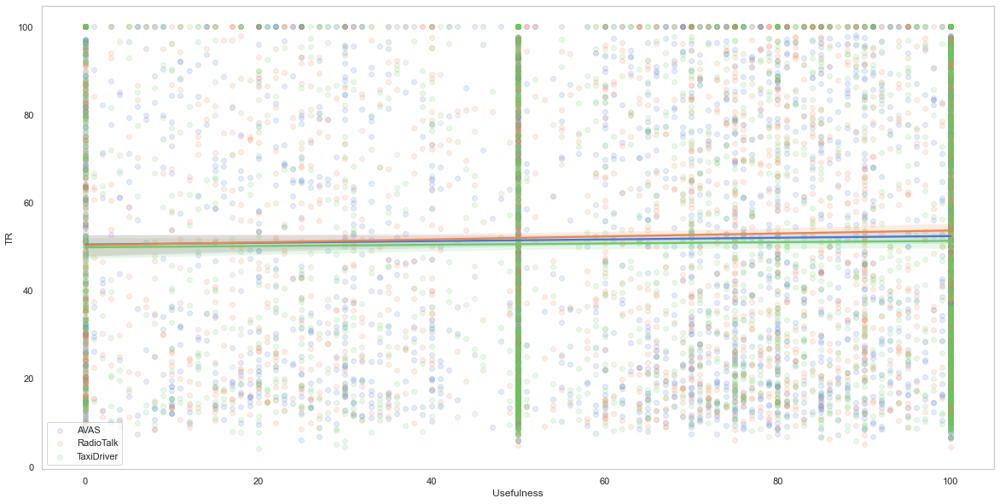

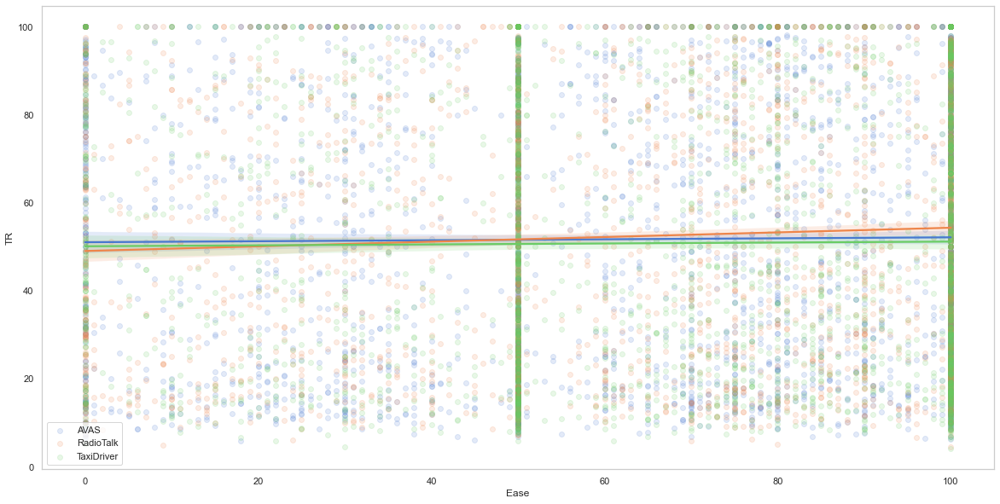

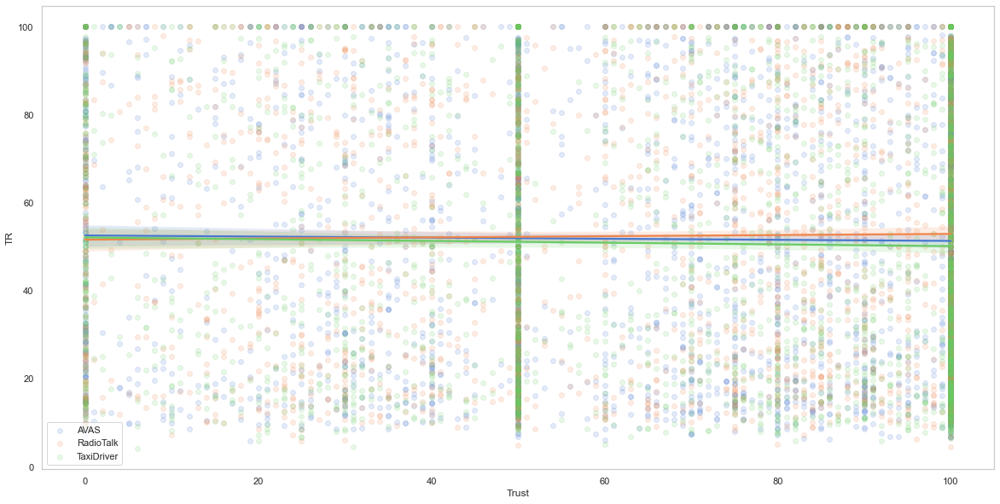

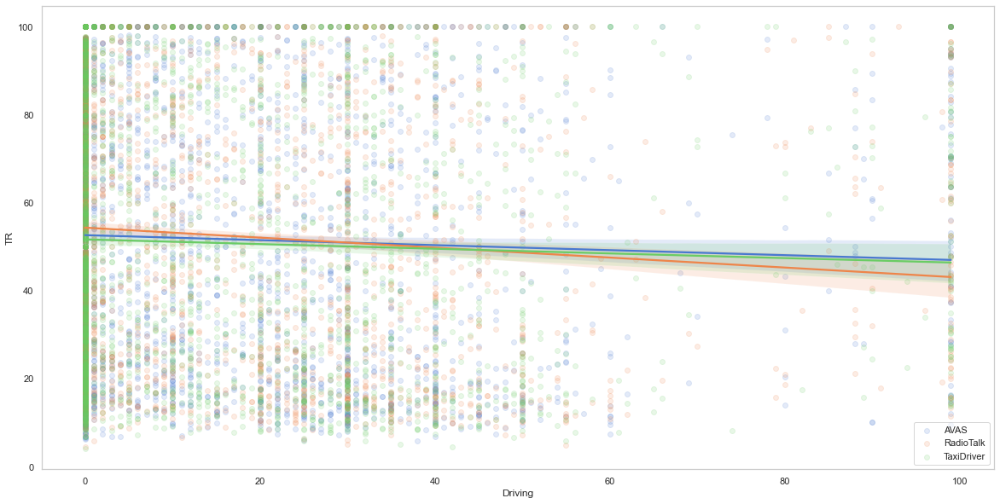

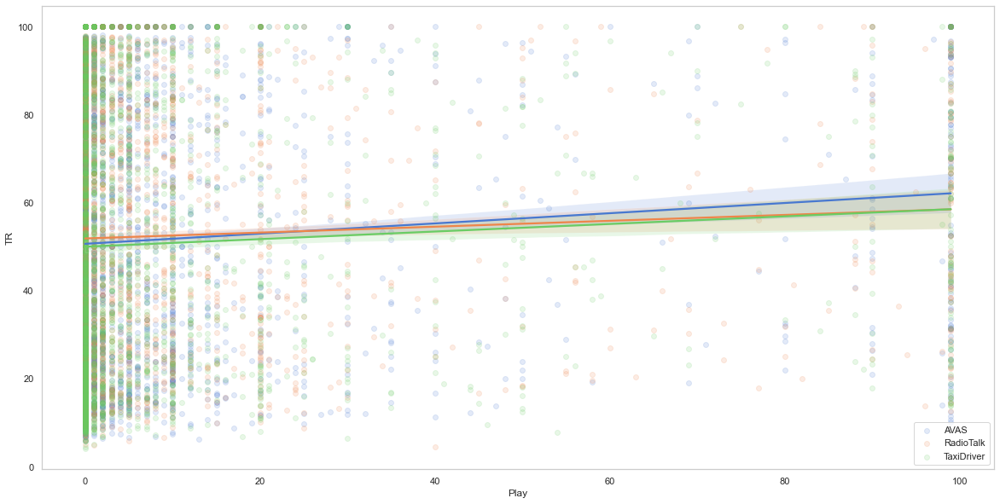

In [62]:
# palette = itertools.cycle(sns.color_palette(palette="muted"))  # color palette
cols = [
    "Intention",
    "Usefulness",
    "Ease",
    "Trust",
    # "Aviophobia",
    "Driving",
    "Play",
]
conds = ["AVAS", "RadioTalk", "TaxiDriver"]
for col in cols:
    palette = itertools.cycle(
        sns.color_palette(palette="muted")
    )  # color palette
    plt.figure(figsize=(20, 10))
    for cnd in conds:
        ax = sns.regplot(
            data=gaze_ctr[gaze_ctr.condition == cnd],
            y="TR",
            x=col,
            color=next(palette),
            label=cnd,
            scatter_kws={"alpha": 0.15},
        )
        ax.grid(False)
    plt.legend()
    plt.show()

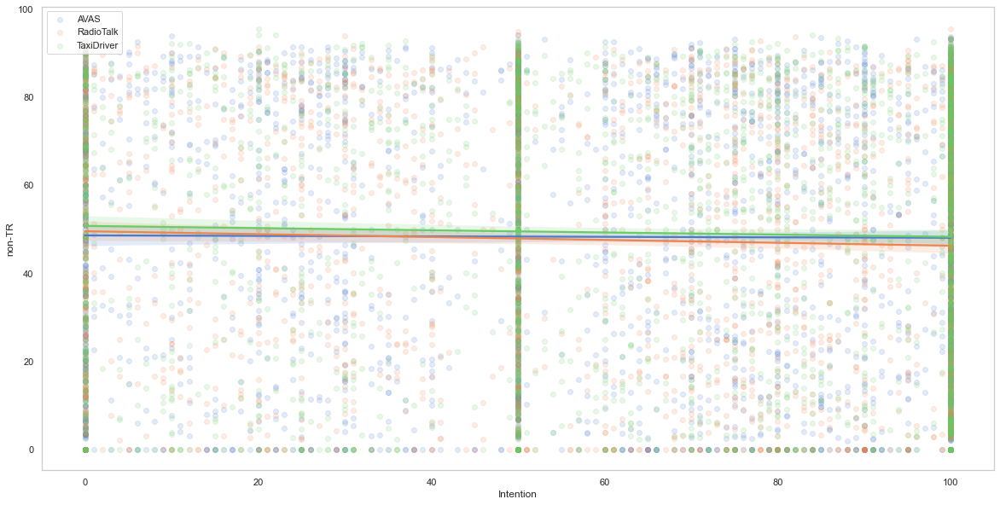

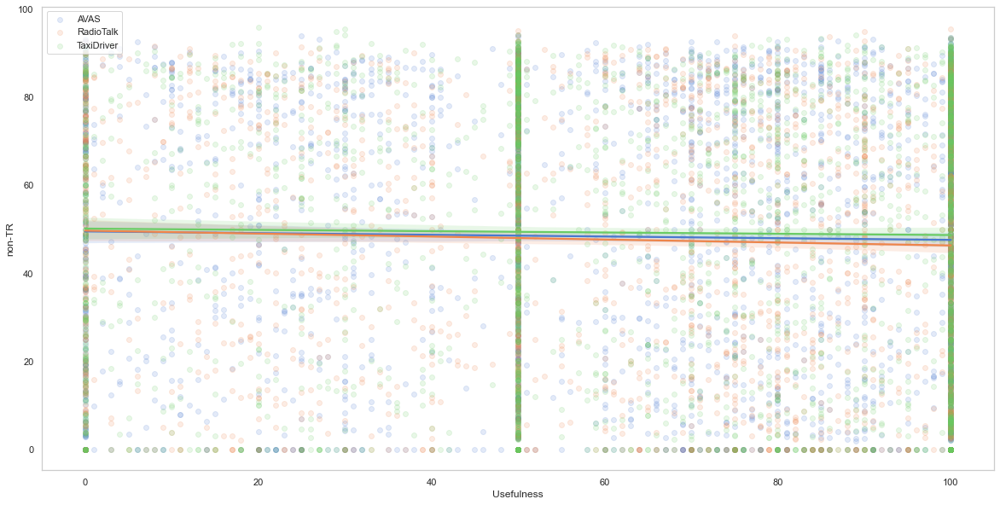

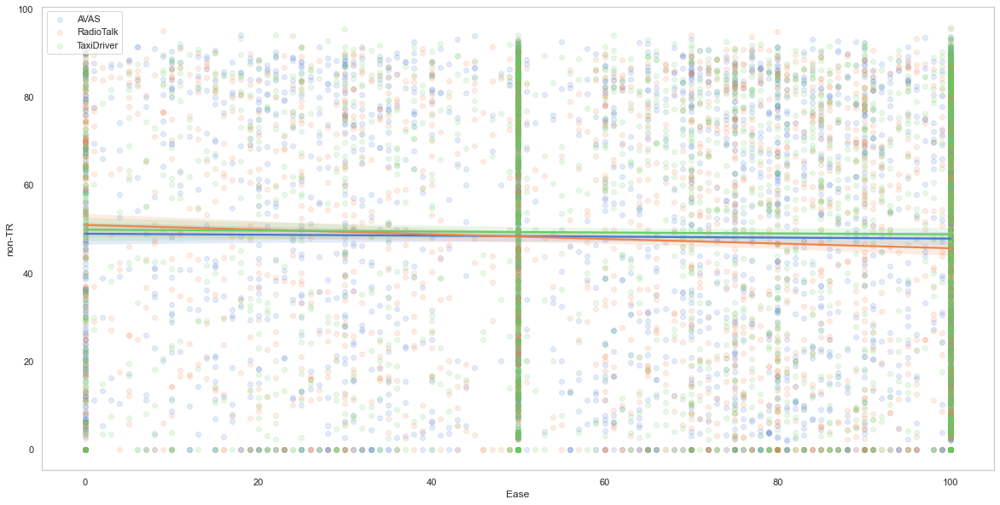

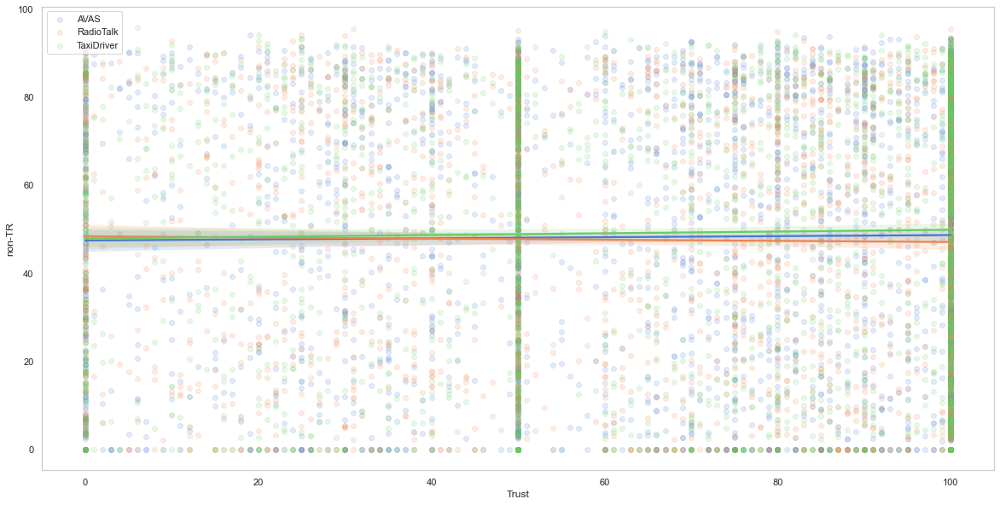

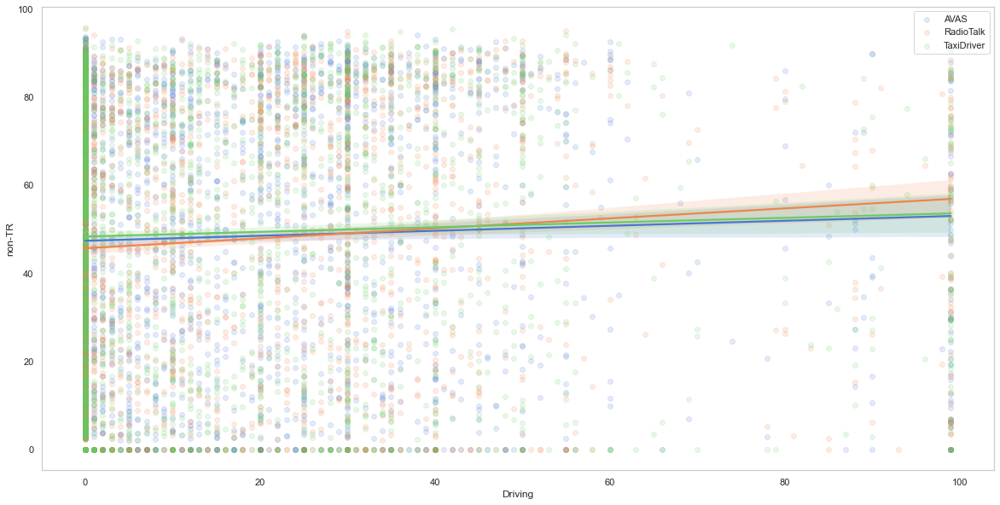

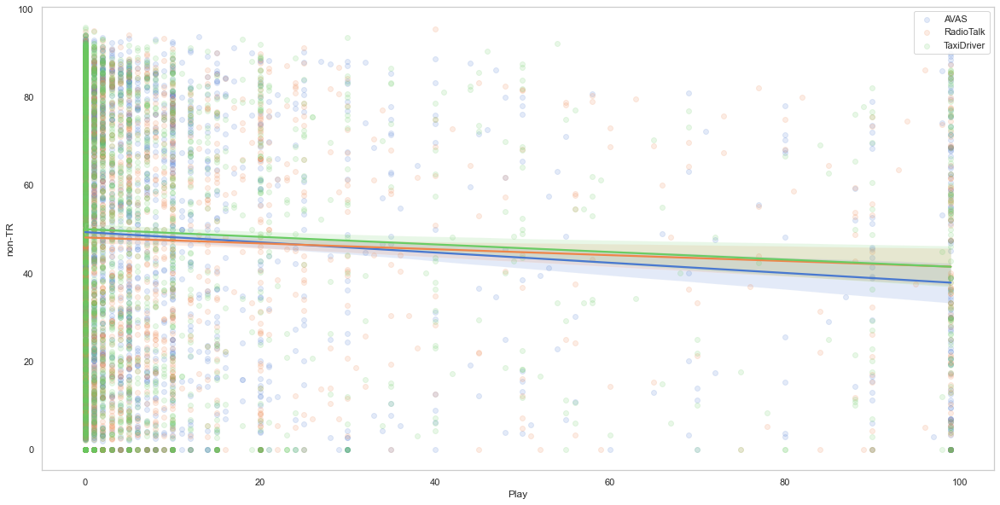

In [63]:
# palette = itertools.cycle(sns.color_palette(palette="muted"))  # color palette
cols = [
    "Intention",
    "Usefulness",
    "Ease",
    "Trust",
    # "Aviophobia",
    "Driving",
    "Play",
]
conds = ["AVAS", "RadioTalk", "TaxiDriver"]
for col in cols:
    palette = itertools.cycle(
        sns.color_palette(palette="muted")
    )  # color palette
    plt.figure(figsize=(20, 10))
    for cnd in conds:
        ax = sns.regplot(
            data=gaze_ctr[gaze_ctr.condition == cnd],
            y="non-TR",
            x=col,
            color=next(palette),
            label=cnd,
            scatter_kws={"alpha": 0.15},
        )
        ax.grid(False)
    plt.legend()
    plt.show()

Load the stored critical event frames

In [64]:
with open("gazes_and_hits-event_frames.json", "r") as file:
    ev_frames = json.load(file)

Plot events high alpha

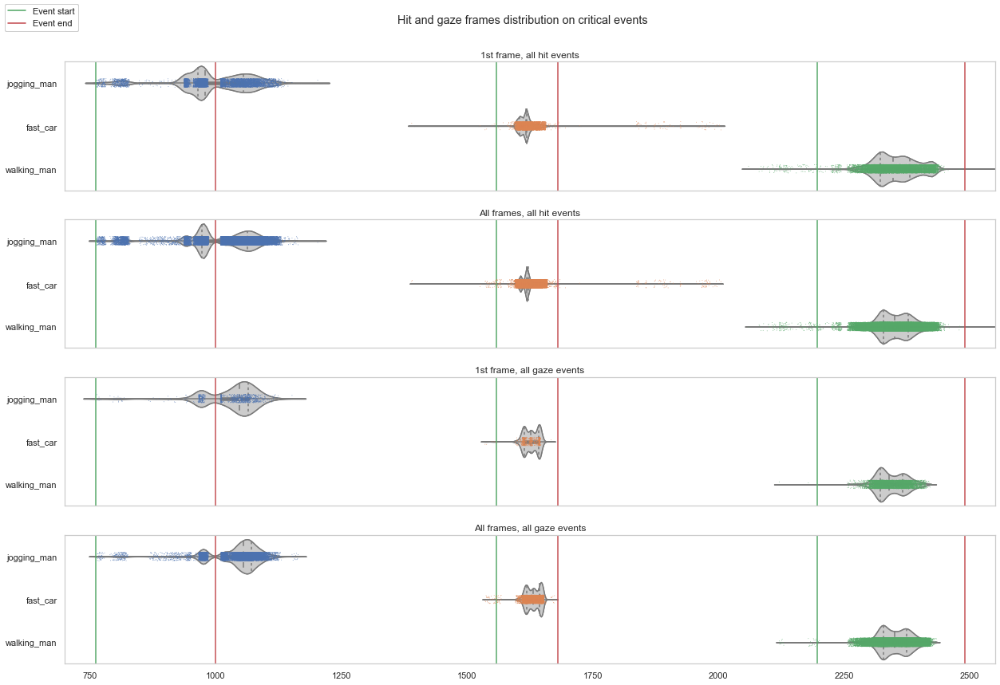

In [65]:
sns.set(rc={"figure.figsize": (17, 12)})  # figure (plot) size
sns.set_style(STYLE)  # set seaborn plotting style

fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(17, 12))
fig.suptitle("Hit and gaze frames distribution on critical events\n\n")
fig.tight_layout()

title_trans = {
    "h_start": "1st frame, all hit events",
    "g_start": "1st frame, all gaze events",
    "h_all": "All frames, all hit events",
    "g_all": "All frames, all gaze events",
}


def plot_event_frames(frames_dict, title, r, alpha=1):
    """
    Description.

    Parameters:
        frames_dict (dict): Blabla
    """
    # load dict into df (easier to plot using seaborn)
    df = pd.DataFrame.from_dict(
        data=frames_dict,
        orient="index",
    ).T
    # violinplot with quartiles
    ax = sns.violinplot(
        data=df,
        orient="h",
        inner="quartile",
        color=".8",
        scale="width",
        ax=axes[r],
    )
    # violinplot with boxplot
    ax = sns.violinplot(
        data=df, orient="h", color=".8", scale="width", ax=axes[r]
    )
    # categorical scatterplot
    ax = sns.stripplot(data=df, orient="h", alpha=alpha, ax=axes[r], size=0.8)

    # plot event ranges (vetical lines)
    for tup in event_ranges:
        axes[r].axvline(x=tup[0] - 400, color="g")  # plot start
        axes[r].axvline(x=tup[1] - 400, color="r")  # plot end
    ax.set_xlim(700, 2550)
    ax.grid(False)
    if r < 3:
        ax.xaxis.set_visible(False)
    ax.title.set_text(title_trans[title])
    # set custom legend for vertical lines
    start_line = Line2D([0], [0], color="g", label="Event start")
    end_line = Line2D([0], [0], color="r", label="Event end")
    fig.legend(handles=[start_line, end_line], loc="upper left")


for i, k in enumerate(ev_frames.keys()):
    plot_event_frames(ev_frames[k], k, i)

plt.show()

Plot events low alpha

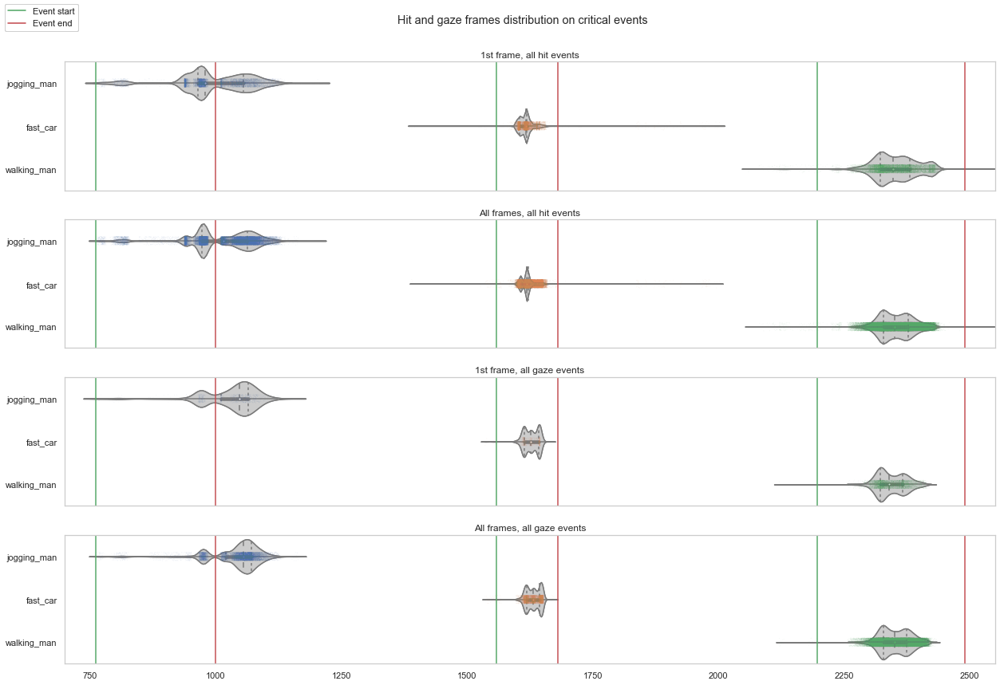

In [66]:
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(17, 12))
fig.suptitle("Hit and gaze frames distribution on critical events\n\n")
fig.tight_layout()

for i, k in enumerate(ev_frames.keys()):
    plot_event_frames(ev_frames[k], k, i, 0.1)

plt.show()

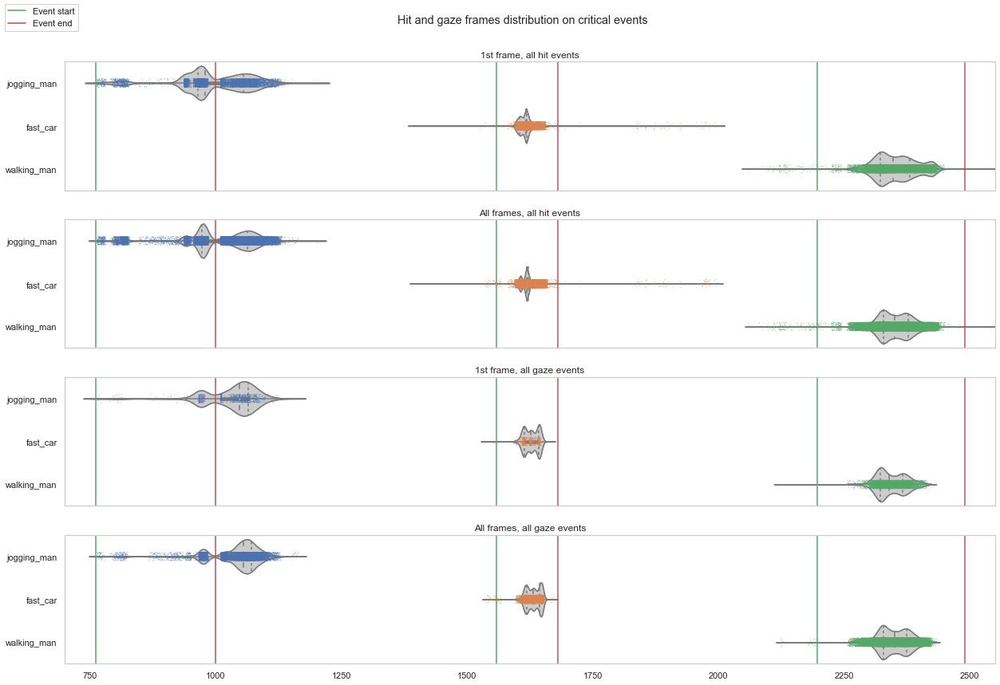

In [67]:
sns.set(rc={"figure.figsize": (17, 12)})  # figure (plot) size
sns.set_style(STYLE)  # set seaborn plotting style

fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(17, 12))
fig.suptitle("Hit and gaze frames distribution on critical events\n\n")
fig.tight_layout()

title_trans = {
    "h_start": "1st frame, all hit events",
    "g_start": "1st frame, all gaze events",
    "h_all": "All frames, all hit events",
    "g_all": "All frames, all gaze events",
}


def plot_event_frames(frames_dict, title, r, alpha=1):
    """
    Description.

    Parameters:
        frames_dict (dict): Blabla
    """
    # load dict into df (easier to plot using seaborn)
    df = pd.DataFrame.from_dict(
        data=frames_dict,
        orient="index",
    ).T
    # violinplot with quartiles
    ax = sns.violinplot(
        data=df,
        orient="h",
        inner="quartile",
        color=".8",
        scale="width",
        ax=axes[r],
    )
    # violinplot with boxplot
    ax = sns.violinplot(
        data=df, orient="h", color=".8", scale="width", ax=axes[r]
    )
    # categorical scatterplot
    ax = sns.stripplot(data=df, orient="h", alpha=alpha, ax=axes[r], size=0.8)

    # plot event ranges (vetical lines)
    for tup in event_ranges:
        axes[r].axvline(x=tup[0] - 400, color="g")  # plot start
        axes[r].axvline(x=tup[1] - 400, color="r")  # plot end
    ax.set_xlim(700, 2550)
    ax.grid(False)
    if r < 3:
        ax.xaxis.set_visible(False)
    ax.title.set_text(title_trans[title])
    # set custom legend for vertical lines
    start_line = Line2D([0], [0], color="g", label="Event start")
    end_line = Line2D([0], [0], color="r", label="Event end")
    fig.legend(handles=[start_line, end_line], loc="upper left")


for i, k in enumerate(ev_frames.keys()):
    plot_event_frames(ev_frames[k], k, i)

plt.show()

In [68]:
parts_evs = copy.deepcopy(parts)
parts_evs

,date,expo,side,condition,questionnaire,nulls_%
id,,,,,,
4f583872ffed48249874b00f3d389cfc,2019-05-14 13:21:00,MSW,right,TaxiDriver,No,1.610
33d68ad55ef544fab9fd08108e3913ca,2019-05-14 16:44:00,MSW,right,AVAS,No,0.037
37d7e67934974217830bb429bba7fd76,2019-05-14 16:54:00,MSW,left,AVAS,No,0.824
9cdd85098b0b4ad5ab2282a5ac371a5e,2019-05-14 16:59:00,MSW,right,AVAS,No,0.000
ff846d92c7e6471183595bd2678f29f6,2019-05-14 17:37:00,MSW,right,AVAS,No,0.037
...,...,...,...,...,...,...
dba04b626e4c4c6e89aea4fb1f9cc32b,2019-12-30 13:48:00,BMBF,left,TaxiDriver,Yes,0.000
611d35a7c3e940cc82495e53c2a8532d,2020-01-03 16:12:00,BMBF,right,TaxiDriver,No,0.674
3b6fda285d9e412eb081986b2f22a2e3,2020-01-03 16:13:00,BMBF,left,AVAS,No,1.797


In [69]:
uids = parts_evs.index.tolist()
PATH_GAZE_FRAMES = "./data/processed/events/frames"

coll_gevs = {
    uid: {"jogging_man": None, "fast_car": None, "walking_man": None}
    for uid in uids
}

# participants progress bar
uids_pbar = tqdm(
    iterable=uids,
    total=len(uids),
    desc="📂 participants",
    dynamic_ncols=True,
    bar_format=B_FORMAT,
)

for uid in uids_pbar:
    try:
        with open(f"{PATH_GAZE_FRAMES}/{uid}.json", "r") as file:
            ev_frames = json.load(file)
            for obj in ev_frames.keys():
                coll_gevs[uid][obj] = len(ev_frames[obj]["g_start"])
    except:
        for obj in coll_gevs[uid].keys():
            coll_gevs[uid][obj] = 0

📄 0 of 20848 📂 participants processed:                                                                        …

In [70]:
test = pd.DataFrame(coll_gevs)
test = test.transpose()
for col in test.columns.tolist():
    parts_evs[col] = test[col]

parts_evs

,date,expo,side,condition,questionnaire,nulls_%,jogging_man,fast_car,walking_man
id,,,,,,,,,
4f583872ffed48249874b00f3d389cfc,2019-05-14 13:21:00,MSW,right,TaxiDriver,No,1.610,0,0,0
33d68ad55ef544fab9fd08108e3913ca,2019-05-14 16:44:00,MSW,right,AVAS,No,0.037,0,0,0
37d7e67934974217830bb429bba7fd76,2019-05-14 16:54:00,MSW,left,AVAS,No,0.824,0,1,0
9cdd85098b0b4ad5ab2282a5ac371a5e,2019-05-14 16:59:00,MSW,right,AVAS,No,0.000,0,0,0
ff846d92c7e6471183595bd2678f29f6,2019-05-14 17:37:00,MSW,right,AVAS,No,0.037,0,0,1
...,...,...,...,...,...,...,...,...,...
dba04b626e4c4c6e89aea4fb1f9cc32b,2019-12-30 13:48:00,BMBF,left,TaxiDriver,Yes,0.000,0,0,0
611d35a7c3e940cc82495e53c2a8532d,2020-01-03 16:12:00,BMBF,right,TaxiDriver,No,0.674,0,0,0
3b6fda285d9e412eb081986b2f22a2e3,2020-01-03 16:13:00,BMBF,left,AVAS,No,1.797,0,0,0


In [71]:
cols = test.columns.tolist()
cols.append("condition")
cols.append("side")
display(parts_evs[cols].groupby(["condition"]).describe().transpose())

condition             AVAS  RadioTalk  TaxiDriver
jogging_man count 7173.000   6867.000    6808.000
            mean     0.048      0.047       0.050
            std      0.234      0.228       0.242
            min      0.000      0.000       0.000
            25%      0.000      0.000       0.000
            50%      0.000      0.000       0.000
            75%      0.000      0.000       0.000
            max      3.000      4.000       3.000
fast_car    count 7173.000   6867.000    6808.000
            mean     0.015      0.024       0.054
            std      0.127      0.158       0.230
            min      0.000      0.000       0.000
            25%      0.000      0.000       0.000
            50%      0.000      0.000       0.000
            75%      0.000      0.000       0.000
            max      2.000      2.000       2.000
walking_man count 7173.000   6867.000    6808.000
            mean     0.379      0.297       0.226
            std      0.542      0.494       0.470
            min      0.000      0.000       0.000
            25%      0.000      0.000       0.000
            50%      0.000      0.000       0.000
            75%      1.000      1.000       0.000
            max      4.000      3.000       3.000

In [72]:
parts_evs[cols]

,jogging_man,fast_car,walking_man,condition,side
id,,,,,
4f583872ffed48249874b00f3d389cfc,0,0,0,TaxiDriver,right
33d68ad55ef544fab9fd08108e3913ca,0,0,0,AVAS,right
37d7e67934974217830bb429bba7fd76,0,1,0,AVAS,left
9cdd85098b0b4ad5ab2282a5ac371a5e,0,0,0,AVAS,right
ff846d92c7e6471183595bd2678f29f6,0,0,1,AVAS,right
...,...,...,...,...,...
dba04b626e4c4c6e89aea4fb1f9cc32b,0,0,0,TaxiDriver,left
611d35a7c3e940cc82495e53c2a8532d,0,0,0,TaxiDriver,right
3b6fda285d9e412eb081986b2f22a2e3,0,0,0,AVAS,left


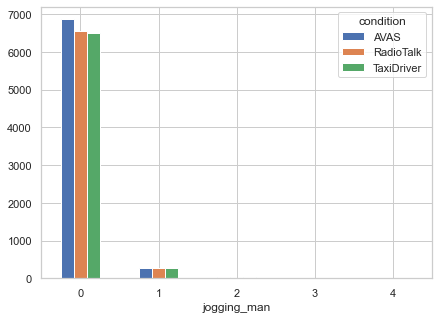

condition,AVAS,RadioTalk,TaxiDriver
jogging_man,,,
0,6863.000,6569.000,6505.000
1,282.000,279.000,270.000
2,25.000,17.000,30.000
3,3.000,1.000,3.000
4,NaN,1.000,NaN


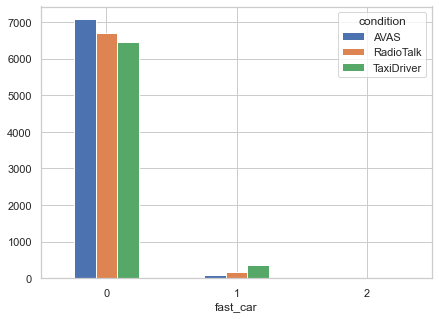

condition,AVAS,RadioTalk,TaxiDriver
fast_car,,,
0,7068,6704,6449
1,101,159,352
2,4,4,7


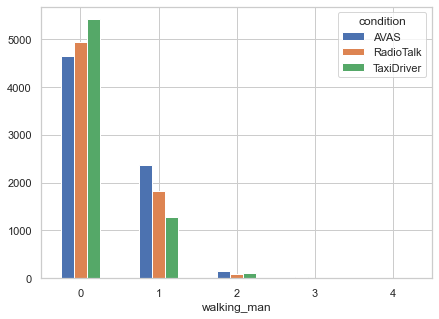

condition,AVAS,RadioTalk,TaxiDriver
walking_man,,,
0,4641.000,4938.000,5410.000
1,2366.000,1827.000,1273.000
2,147.000,93.000,109.000
3,17.000,9.000,16.000
4,2.000,NaN,NaN


In [73]:
cols = test.columns.tolist()
for col in cols:
    ax = (
        parts_evs.groupby(col)["condition"]
        .value_counts()
        .unstack()
        .plot.bar(figsize=(7, 5), rot=0)
    )
    plt.show()
    display(
        parts_evs.groupby("condition")[col]
        .value_counts()
        .unstack()
        .transpose()
    )

In [74]:
with open("gazes_and_hits-event_frames.json", "r") as file:
    ev_frames = json.load(file)

events = ev_frames["g_start"].keys()

for e in events:
    print(f"Event {e}: {len(ev_frames['g_start'][e])}")

Event jogging_man: 1030
Event fast_car: 701
Event walking_man: 6572


In [75]:
parts_evs[events].sum()

jogging_man    1000
fast_car        642
walking_man    6298
dtype: int64